# **AFT - Alignment by Fourier Transform**
---

<font size = 4> AFT is a tool for the calculation of fiber alignment from biological images and was  published by [Marcotti *et al.* in 2021](https://www.frontiersin.org/journals/computer-science/articles/10.3389/fcomp.2021.745831/full).

<font size = 4> This notebook provides an implementation of this instrument in Colab or using your local machine.

<font size = 4> The original algorithms could be found in this [GitHub repository](https://github.com/OakesLab/AFT-Alignment_by_Fourier_Transform).

<font size = 4>See [here](https://scholar.google.co.uk/scholar?cites=4208027465964650686&as_sdt=2005&sciodt=0,5&hl=en) for a list of publications that have successfully utilized AFT!



# How to Run AFT-tracks on Your Local Machine

If you want to run AFT-tracks locally, follow these steps:

1. **Install Required Software**  
   Download and install:  
   - [Anaconda](https://www.anaconda.com/download)  
   - [GitHub Desktop](https://desktop.github.com/download/)

2. **Create a New Anaconda Environment**  
   Open **Anaconda Prompt** and run:

  *   conda create -n my_aft_env python=3.9 -y
  *   conda activate my_aft_env
3. **Install Required Python Packages**  
Run the following command:
  * conda install -c conda-forge matplotlib pandas numpy scikit-image seaborn scipy tifffile notebook
4. **Launch Jupyter Notebook**  
Start the Jupyter Notebook interface:
  * jupyter notebook
5. **Open the Notebook File**  
  * Navigate to the folder where the notebook is saved.  
  * Open the file.  
  * Skip the cell that mounts Google Drive (this is only for Google Colab).




---

#   **Part 0. Prepare Google Colab or local session**

---

### **0.1.Install key dependencies (Colab session)**

<font size = 4>

In [1]:
!git clone https://github.com/OakesLab/AFT-Alignment_by_Fourier_Transform.git
!git clone https://github.com/CellMigrationLab/CellTracksColab.git
!git clone https://github.com/wanglab-georgetown/fractal.git

!pip install ridge-detector
!pip install git+https://github.com/jni/skan

fatal: destination path 'AFT-Alignment_by_Fourier_Transform' already exists and is not an empty directory.
fatal: destination path 'CellTracksColab' already exists and is not an empty directory.
fatal: destination path 'fractal' already exists and is not an empty directory.

[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: pip install --upgrade pip
  Cloning https://github.com/jni/skan to /private/var/folders/rw/8tl2yqc157d0_bl_vpf23bjr0000gn/T/pip-req-build-anmsxu_y
  Running command git clone --filter=blob:none --quiet https://github.com/jni/skan /private/var/folders/rw/8tl2yqc157d0_bl_vpf23bjr0000gn/T/pip-req-build-anmsxu_y
  Resolved https://github.com/jni/skan to commit 94ec591f4a2763795b84141d6a85cb6fd0ab6b2a
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done

[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: pip install --upgrad

In [1]:
# ============================================================
# UNIVERSAL BOOTSTRAP (paths + deps) — WORKS EVERYWHERE
# ============================================================

import sys
import os
import subprocess
import importlib.util
import glob
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import io
from skimage import io, img_as_float
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from skimage.morphology import skeletonize
from skimage.measure import label
from ipywidgets import Dropdown


# ------------------------------------------------------------
# 1. AUTO-INSTALL REQUIRED PACKAGES (SAFE)
# ------------------------------------------------------------

REQUIRED_PACKAGES = [
    "requests",
    "numpy",
    "scipy",
    "pandas",
    "matplotlib",
    "seaborn",
    "scikit-image",
    "scikit-learn",
    "opencv-python",
    "tqdm",
    "lxml",
    "ipywidgets",
]

def ensure_package(pkg):
    if importlib.util.find_spec(pkg) is None:
        subprocess.check_call([sys.executable, "-m", "pip", "install", pkg])

for pkg in REQUIRED_PACKAGES:
    ensure_package(pkg)

# ------------------------------------------------------------
# 2. DETECT COLAB / LOCAL
# ------------------------------------------------------------

IN_COLAB = False
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    pass

# ------------------------------------------------------------
# 3. ROOT PATHS
# ------------------------------------------------------------

if IN_COLAB:
    BASE = "/content"
else:
    BASE = os.getcwd()

FRACTAL_ROOT = os.path.join(BASE, "fractal")
CELLTRACKS_ROOT = os.path.join(BASE, "CellTracksColab")
AFT_ROOT = os.path.join(BASE, "AFT-Alignment_by_Fourier_Transform", "Python_implementation")

# ------------------------------------------------------------
# 4. FIX BROKEN GITHUB IMPORTS 
# ------------------------------------------------------------

PATHS = [
    FRACTAL_ROOT,
    os.path.join(FRACTAL_ROOT, "fractal"),  # needed for `from utils import ...`
    CELLTRACKS_ROOT,
    AFT_ROOT,
]

for p in PATHS:
    if os.path.exists(p) and p not in sys.path:
        sys.path.insert(0, p)

# ------------------------------------------------------------
# 5. IMPORTS 
# ------------------------------------------------------------

from fractal import box_counting

import celltracks
from celltracks.data_loader import TrackingData, check_for_nans
from celltracks.Track_Plots import *
from celltracks.BoxPlots_Statistics import *
from celltracks.Dimensionality_Reduction import *

import AFT_tools as AFT
import AFT_figures
import AFT_metrics
import AFT_additional_parameters_7 as AFT_additional_parameters
import segmentation


# ------------------------------------------------------------
# 6. FINAL CHECK
# ------------------------------------------------------------

print("BOOTSTRAP OK")
print("box_counting:", box_counting)
print("celltracks:", celltracks.__file__)
print("AFT:", AFT.__file__)



[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: pip install --upgrade pip



[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: pip install --upgrade pip



[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: pip install --upgrade pip


BOOTSTRAP OK
box_counting: <function box_counting at 0x118c8c040>
celltracks: /Users/iukhtanov.daniil/envs/AFT_tracks/AFT_tracks_23122025/CellTracksColab/celltracks/__init__.py
AFT: /Users/iukhtanov.daniil/envs/AFT_tracks/AFT_tracks_23122025/AFT-Alignment_by_Fourier_Transform/Python_implementation/AFT_tools.py


### **0.2. Mount to Google drive (if your images on Google drive)**

<font size = 4> To use this notebook on the data present in your Google Drive, you need to mount your Google Drive to this notebook.

<font size = 4> Play the cell below to mount your Google Drive and follow the instructions.

<font size = 4> Once this is done, your data are available in the **Files** tab on the top left of notebook.

<font size = 4> Also, you can add your files directly to the **Files** tab or, in case you work localy, write path to your images in the next part



In [12]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google'

---

#   **Part 1. Import data, select your parameters and paths**

---

### 1.1 Set paths to your tracking and ECM data



<font size = 4>**Track_table**: The directory path for tracking data files in .csv formats.

<font size = 4>**Spot_table**: The directory path for tracking data files in .csv formats.

<font size = 4> **Image_folder**: The directory path for ECM images.

<font size = 4>**Results_folder**: The directory path for AFT output.

In [2]:
# @markdown ##Provide the path to your CellTracksColab datasets and images:

Track_table = "/Users/iukhtanov.daniil/Desktop/AFT_input/BF_datasets/tracks/merged_Tracks.csv"  # @param {type: "string"}
Spot_table = "/Users/iukhtanov.daniil/Desktop/AFT_input/BF_datasets/tracks/merged_Spots.csv"  # @param {type: "string"}
Image_folder = "/Users/iukhtanov.daniil/Desktop/AFT_input/Glioblastoma/images/temp" # @param {type: "string"}
#@markdown ###Provide the path to your Result folder

Results_Folder = r'/Users/iukhtanov.daniil/Desktop/AFT_input/Glioblastoma/Output/Glioblastoma'  # @param {type: "string"}

# Update the parameters to load the data
CellTracks = TrackingData()
CellTracks.data_type = "CellTracksColab"
CellTracks.data_dims = "2D"
CellTracks.Spot_table = Spot_table
CellTracks.Track_table = Track_table

CellTracks.Results_Folder = Results_Folder
CellTracks.skiprows = None

# Load data
CellTracks.LoadTrackingData()

merged_spots_df = CellTracks.spots_data
check_for_nans(merged_spots_df, "merged_spots_df")
merged_tracks_df = CellTracks.tracks_data

exts = ("*.tif", "*.tiff", "*.png", "*.jpg", "*.jpeg")
im_list = []
for ext in exts:
    if ext != "_mask":
        im_list.extend(glob.glob(os.path.join(Image_folder, ext)))
mask_list = [f for f in im_list if "_mask" in os.path.basename(f)]        
im_list = [f for f in im_list if "_mask" not in os.path.basename(f)]

im_list = sorted(im_list)

print("...Done")

Loading track table file....
Tracks Dataframe has consistent metadata.
Loading spot table file....
Spots Dataframe has consistent metadata.
Starting to filter tracks with fewer than two spots...
Found 257 tracks with two or more spots.
Filtering complete. Returning filtered DataFrames.
Data columns mapped as: {'TRACK_ID': 'ID', 'POSITION_X': 'POSITION_X', 'POSITION_Y': 'POSITION_Y', 'POSITION_T': 'POSITION_T'}.
Dataset processing completed in 0.10 seconds.
Column 'SNR_CH1' in merged_spots_df contains 10 infinity values. Replacing with NaN.
Column 'MANUAL_SPOT_COLOR' in merged_spots_df contains 15633 NaN values.
Column 'SNR_CH1' in merged_spots_df contains 10 NaN values.
...Done


### 1.2 Define pixel value

<font size = 4> **physical_values**: If your Tracks and Spots data 'POSITION_X', 'POSITION_Y' contain coordinats in physical units - click True. If they are in pixels stay it in Flase position

<font size = 4> **px_x**: pixel size in X
<font size = 4> **px_y**: position in Y

In [4]:
units_um = True  # @param {type: "boolean"}

px_x = 0.7246 # @param {"type":"number"}
px_y = 0.7246 # @param {"type":"number"}

if units_um == True:
  merged_spots_df['POSITION_X'] = merged_spots_df['POSITION_X'] / px_x
  merged_spots_df['POSITION_Y'] = merged_spots_df['POSITION_Y'] / px_y

### 1.3 Define AFT parameters


<font size = 4> **single_frame**: If `True`, runs AFT on a single-frame image (or the first frame of a stack) and uses that field for all time points; if `False`, runs per frame.

<font size = 4>**window_size**: AFT window size (pixels). Larger windows = smoother field, fewer vectors.

<font size = 4>**overlap**: Overlap fraction between windows (0–1). Higher = denser vectors.

<font size = 4>**neighborhood_radius**: How many neighbors will be counted for
order calculation

<font size = 4>**intensity_thresh**: Minimum mean intensity for a window to be considered. Filters dim/noisy regions.

<font size = 4>**eccentricity_thresh**: Filters windows with low orientation confidence (0–1).

<font size = 4>**im_mask**: Optional binary mask to restrict AFT to specific regions. If `None`, AFT runs on the whole image.

Preview image shape: (2048, 2048)

Selected parameters:
  window_size = 50
  overlap = 0.8
  neighborhood_radius = 2
  eccentricity_thresh = 0

Saved preview to: /Users/iukhtanov.daniil/Desktop/AFT_input/Glioblastoma/Output/Glioblastoma/preview_images/ctrl_R2_pos1_ws50_ov0.8_nr2_et0.png


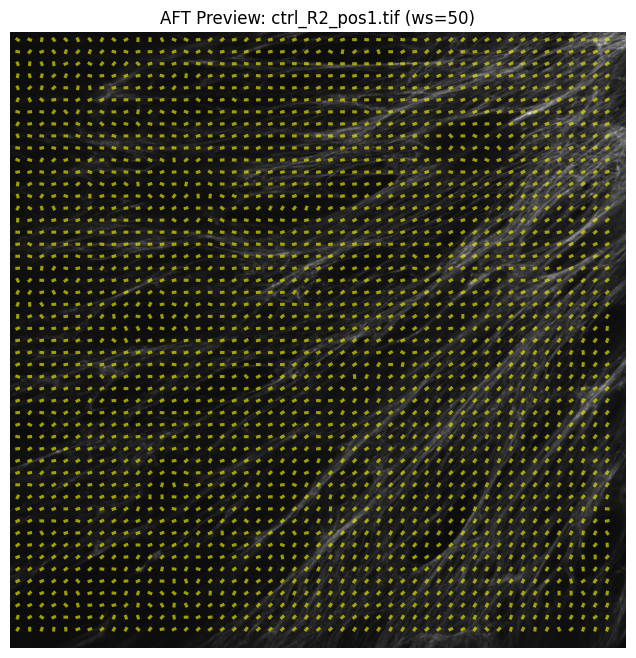

In [3]:
#### define the frame ####
single_frame = True # @param {type: "boolean"}

#### required AFT parameters ####
window_size = 50 # @param {"type":"integer"}
overlap = 0.8 # @param {"type":"number"}
neighborhood_radius = 2 # @param {type: "integer"}

#### optional parameters ####
intensity_thresh = 0 # @param {type: "integer"}
eccentricity_thresh = 0 # @param {type: "integer"}
im_mask = None # @param {type: "string"}

preview = AFT_figures.AFT_preview(im_list, Results_Folder,
                    window_size, overlap,
                    neighborhood_radius, eccentricity_thresh,
                    im_mask, intensity_thresh)

---

#   **Part 2. Run analysis**

---

### Choose metrics for analysis

<font size = 4> **AFT-AI**: Analysis of angle between tracks and AFT AFT-Δφ (angle difference) and AFT-AI (cos² alignment)

<font size = 4>**Eccentricity**: Analysis of eccentrisity; measure of how much ECM oriented in one direction

<font size = 4> **Order**: Analysis of the order of each window compared to the neighbor windows

<font size = 4> **Intensity**: Analysis of the intensity in each window; mean intensity in output

<font size = 4>**Density**: Analysis of density in each window based on Fourier Transformation

In [27]:
AFT_AI = True # @param {type: "boolean"}
Eccenticity = True # @param {type: "boolean"}
Order = True # @param {type: "boolean"}
Intensity = True # @param {type: "boolean"}
Density = True # @param {type: "boolean"}
Save_data = True # @param {type: "boolean"}

In [28]:
if AFT_AI == True:
  df_subset_out = AFT_metrics.AFT_AI_metric(
      im_list=im_list,
      df_spots=merged_spots_df,
      window_size=window_size,
      overlap=overlap,
      im_mask=im_mask,
      intensity_thresh=intensity_thresh,
      eccentricity_thresh=eccentricity_thresh,
      single_frame=single_frame,
      px_size_x=px_x,
      px_size_y=px_y
  )
if Order == True:
  df_order = AFT_metrics.AFT_order_parameter(
    im_list=im_list,
    window_size=window_size,
    overlap=overlap,
    im_mask=im_mask,
    neighborhood_radius = 1,
    intensity_thresh=intensity_thresh,
    eccentricity_thresh=eccentricity_thresh,
    single_frame=single_frame
  )
if Intensity == True:
  df_intensity = AFT_metrics.intensity_calculation(
      im_list=im_list,
      window_size=window_size,
      overlap=overlap,
      im_mask=im_mask,
      intensity_thresh=0,
      single_frame=single_frame
  )
if Density == True:
  df_density = AFT_metrics.density_calculation(
      im_list=im_list,
      window_size=window_size,
      overlap=overlap,
      im_mask=None,
      intensity_thresh=0,
      single_frame=True
  )
if Save_data == True:
  merged_spots_df = AFT_metrics.data_saving_spots_only(
    df_spots=merged_spots_df,
    df_subset_out=df_subset_out,
    df_intensity=df_intensity,
    df_density=df_density,
    df_order=df_order,
    Results_Folder=Results_Folder
  )

/Users/iukhtanov.daniil/envs/AFT_tracks/AFT_tracks_23122025/AFT_metrics.py:159: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_track_out = pd.concat([df_track_out, df_out_merge], ignore_index=True)


Image 0: df_subset shape = (4118, 37), frames = 96


/Users/iukhtanov.daniil/envs/AFT_tracks/AFT_tracks_23122025/AFT_metrics.py:159: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_track_out = pd.concat([df_track_out, df_out_merge], ignore_index=True)


Image 1: df_subset shape = (5255, 37), frames = 96


/Users/iukhtanov.daniil/envs/AFT_tracks/AFT_tracks_23122025/AFT_metrics.py:159: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_track_out = pd.concat([df_track_out, df_out_merge], ignore_index=True)


Image 2: df_subset shape = (3270, 37), frames = 96


/Users/iukhtanov.daniil/envs/AFT_tracks/AFT_tracks_23122025/AFT_metrics.py:159: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_track_out = pd.concat([df_track_out, df_out_merge], ignore_index=True)


Image 3: df_subset shape = (2990, 37), frames = 96
Processed Carboxyamidotriazole_10uM_01.tif
Processed Carboxyamidotriazole_10uM_02.tif
Processed Untreated_06.tif
Processed Untreated_08.tif
Intensity processed: Carboxyamidotriazole_10uM_01.tif
Intensity processed: Carboxyamidotriazole_10uM_02.tif
Intensity processed: Untreated_06.tif
Intensity processed: Untreated_08.tif
Density processed: Carboxyamidotriazole_10uM_01.tif
Density processed: Carboxyamidotriazole_10uM_02.tif
Density processed: Untreated_06.tif
Density processed: Untreated_08.tif
Successfully merged intensity, density, order into SPOTS table


### Segmentation based analysis

Define parameters for segmentation

In [4]:
contrastLow = 30 # @param {"type":"integer"}
contrastHigh = 180 # @param {"type":"integer"}
darkline = False      # @param {type: "boolean"}
intensity_clip_percent = 10 # @param {"type":"number"} # percentage of pixels to saturate
windows_curvature = [10] # @param {"type":"integer"}
minLineWidth = 5 # @param {"type":"integer"}
maxLineWidth = 15 # @param {"type":"integer"}
do_skeleton = True # @param {type: "boolean"}
do_enhance_contrast = True # @param {type: "boolean"}
prune_short = True # @param {type: "boolean"}
minimumBranchLength = 20 # @param {"type":"integer"}

Define image that you will use to test ECM segmentation

In [5]:
# @title Define image that you will use to test ECM segmentation
files = [f for f in os.listdir(Image_folder) if f.lower().endswith((".tif", ".tiff", ".png", ".jpg"))]
files = [f for f in files if "_mask" not in os.path.basename(f)]

image_selector = Dropdown(
    options=files,
    description='Image:',
    value=files[0] if files else None,
    layout={'width': '400px'}
)

image_selector

Dropdown(description='Image:', layout=Layout(width='400px'), options=('ctrl_R2_pos1.tif',), value='ctrl_R2_pos…

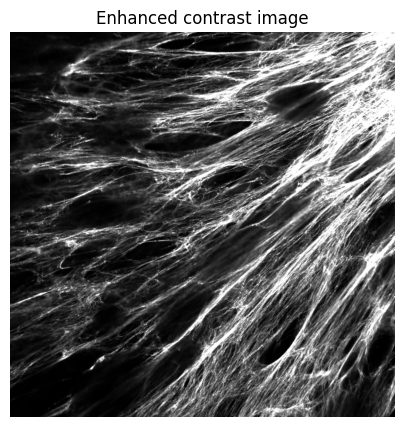

In [6]:
# @title Apply contrast

import segmentation 
from skimage import img_as_float

pathway = os.path.join(Image_folder, image_selector.value)
#read the image and convert to float to enhance contrast workability 
im8 = img_as_float(io.imread(pathway))
if im8.ndim == 3:
    im8 = im8[0]

img_shown = segmentation.enhance_contrast(im8, intensity_clip_percent)

/Users/iukhtanov.daniil/envs/AFT_tracks/AFT_tracks_23122025/segmentation.py:144: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  H_elems = hessian_matrix(img, sigma=sigma, order='xy') #give a hessian matrix with gausian filter (sigma defined in function below)


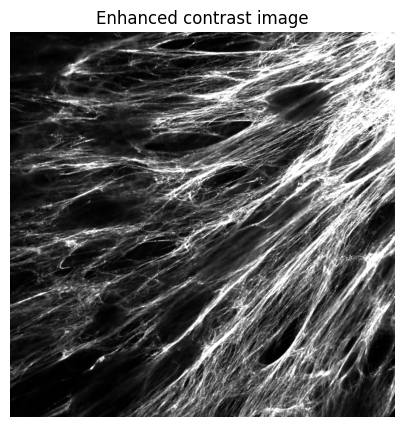

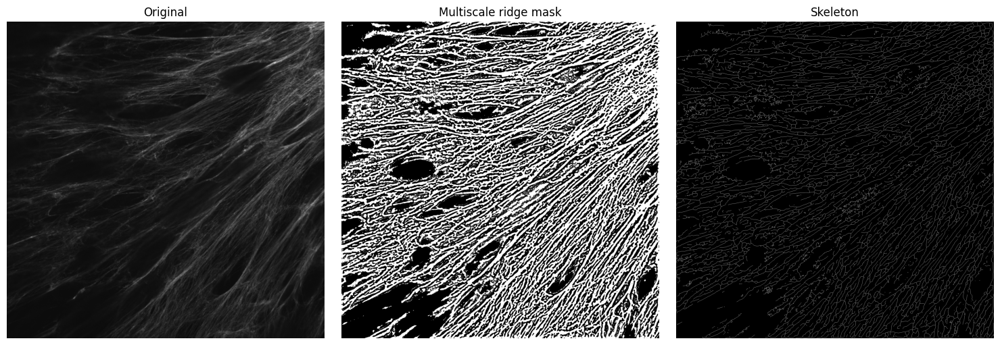

In [7]:
im_mask = io.imread(os.path.join(Image_folder, image_selector.value.replace(".tif", "_mask.tiff")))

mask, skel = segmentation.run_multiscale_ridge_detection(
      im8,
      im_mask,
      minLineWidth,
      maxLineWidth,
      minimumBranchLength,
      do_skeleton,
      do_enhance_contrast,
      intensity_clip_percent,
      prune_short,
      contrastLow,
      contrastHigh,
      darkline
)

plt.figure(figsize=(15, 5))

# 1. Original
plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(im8, cmap="gray")
plt.axis("off")

# 2. Multiscale ridge mask
plt.subplot(1, 3, 2)
plt.title("Multiscale ridge mask")
plt.imshow(mask, cmap="gray")
plt.axis("off")

# 3. Skeleton
plt.subplot(1, 3, 3)
plt.title("Skeleton")
plt.imshow(skel, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()

/Users/iukhtanov.daniil/envs/AFT_tracks/AFT_tracks_23122025/segmentation.py:144: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  H_elems = hessian_matrix(img, sigma=sigma, order='xy') #give a hessian matrix with gausian filter (sigma defined in function below)
/Users/iukhtanov.daniil/envs/AFT_tracks/AFT_tracks_23122025/segmentation.py:331: VisibleDeprecationWarning: separator in column name will change to _ in version 0.13; to silence this warning, use `separator='-'` to maintain current behavior and use `separator='_'` to switch to the new default behavior.
  summary = summarize(sk)
/Users/iukhtanov.daniil/envs/AFT_tracks/AFT_tracks_23122025/segmentation.py:331: VisibleDeprecationWarning: separator in column name will change to _ in version 0.13; to silence this warning, use `separator='-'` to maintain current behavior and use `separator='_'` to 

        image_name  ECM_x  ECM_y  intensity     HDM  endpoints  \
0     ctrl_R2_pos1    185     25   0.001904  0.0872          2   
1     ctrl_R2_pos1    225     25   0.002038  0.3872          3   
2     ctrl_R2_pos1    265     25   0.001964  0.2536          2   
3     ctrl_R2_pos1    305     25   0.001889  0.0956          2   
4     ctrl_R2_pos1    505     25   0.001977  0.0748          3   
...            ...    ...    ...        ...     ...        ...   
2405  ctrl_R2_pos1   1825   1985   0.002020  0.3548          7   
2406  ctrl_R2_pos1   1865   1985   0.001949  0.1784          3   
2407  ctrl_R2_pos1   1905   1985   0.002141  0.4628          6   
2408  ctrl_R2_pos1   1945   1985   0.002436  0.5428         10   
2409  ctrl_R2_pos1   1985   1985   0.003071  0.5196         10   

      norm_endpoints  norm_branch  curvature_mean  branch_points       FFD  \
0           0.180651     0.000000             NaN              0  0.729321   
1           0.031713     0.073997        0.045739  

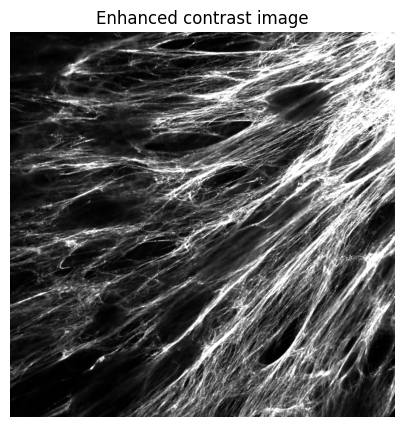

In [8]:
# @title Feature extraction

df = segmentation.segmentation_features(im_list, windows_curvature, window_size, overlap,
                           im_mask, intensity_thresh, intensity_clip_percent, eccentricity_thresh,minLineWidth,
                           maxLineWidth, minimumBranchLength, do_skeleton, do_enhance_contrast,
                           prune_short, contrastLow, contrastHigh, darkline)

print(df)

---

#   **Part 3. AFT Figures**

---

### 3.1 Plot original fibre image with colour-coded track overlay

AFT_plots_function

KeyboardInterrupt: 

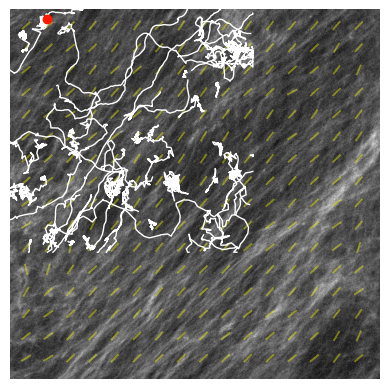

In [ ]:
import AFT_figures
importlib.reload(AFT_figures)

AFT_figures.plot_AFT_overlays(
    im_list=im_list,
    df_subset_out=df_subset_out,
    window_size=window_size,
    overlap=overlap,
    im_mask=im_mask,
    intensity_thresh=intensity_thresh,
    eccentricity_thresh=eccentricity_thresh,
    single_frame=single_frame,
    px_size_x=px_x,
    px_size_y=px_y,
    output_image_folder="AFT_output"
)


### 3.2. Plot track with trajectory and alignment vectors

In [ ]:
import AFT_figures
importlib.reload(AFT_figures)

AFT_figures.plot_track_vectors(
    df_subset_out=df_subset_out,
    im_list=im_list,
    output_image_folder=Results_Folder,
    single_frame=single_frame
)

---

#   **Part 4. Additional parameters**

---

In [40]:
merged_spots_df = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT.csv"))

In [41]:
import pandas as pd
import numpy as np
import os


duration_on = True  # @param {type: "boolean"}
directionality_on = True  # @param {type: "boolean"}
tortuosity_on = True  # @param {type: "boolean"}
calculate_total_turning_angle = True  # @param {type: "boolean"}
calculate_spatial_coverage = True  # @param {type: "boolean"}
fmi_on = True  # @param {type: "boolean"}
calculate_track_metrics_rolling_on = True  # @param {type: "boolean"}
calculate_rolling_directionality_on = True  # @param {type: "boolean"}
calculate_rolling_tortuosity_on = True  # @param {type: "boolean"}
calculate_rolling_total_turning_angle_on = True  # @param {type: "boolean
calculate_rolling_spatial_coverage_on = True  # @param {type: "boolean"}

In [42]:
# @title ##Additional parameters without rolling window

def assign_segments_by_frame(df, frame_col='FRAME'):
    frames = df[frame_col].to_numpy()

    breaks = np.where(np.diff(frames) != 1)[0] + 1
    boundaries = np.r_[0, breaks, len(df)]

    segments = np.full(len(df), np.nan, dtype=object)

    for start, end in zip(boundaries[:-1], boundaries[1:]):
        if end - start < 2:
            continue

        f_start = frames[start]
        f_end = frames[end - 1]

        segments[start:end] = f'segment_{f_start}_{f_end}'

    return segments

def track_additional_metrics_per_ECM(df, time_step):

    df = df.sort_values(
        by=['File_name', 'ECM_ID', 'TRACK_ID', 'FRAME']
    ).copy()

    df['segment'] = np.nan

    for _, idx in df.groupby(['File_name', 'ECM_ID', 'TRACK_ID']).groups.items():
        sub = df.loc[idx]

        if len(sub) < 2:
            continue

        segments = assign_segments_by_frame(sub)

        df.loc[idx, 'segment'] = segments

    return df

merged_spots_df = track_additional_metrics_per_ECM(
    merged_spots_df,
    time_step=1
)

if duration_on == True:
    from celltracks.Track_Metrics import calculate_track_metrics

    print("Calculating track metrics...")

    merged_spots_df.dropna(subset=['POSITION_X', 'POSITION_Y', 'POSITION_Z'], inplace=True)

    tqdm.pandas(desc="Calculating Track Metrics")

    duration_df = merged_spots_df.copy()

    columns_to_remove = [
        "Track Duration per patch",
        "Mean Speed per patch",
        "Max Speed per patch",
        "Min Speed per patch",
        "Median Speed per patch",
        "Speed Standard Deviation per patch",
        "Total Distance Traveled per patch"
    ]

    for column in columns_to_remove:
        if column in duration_df.columns:
            duration_df.drop(column, axis=1, inplace=True)

    duration_df.sort_values(by=['Unique_ID', 'ECM_ID', 'POSITION_T', 'segment'], inplace=True)

    valid_groups_list = []
    invalid_groups_list = []
    for (unique_id, ecm_id, segment), group in duration_df.groupby(['Unique_ID', 'ECM_ID', 'segment']):
        if group['POSITION_T'].nunique() >= 2: #maybe delete because I sort it on segment defining step? 
            valid_groups_list.append(group)
        else:
            invalid_groups_list.append(group)
    print(f"Number of valid groups: {len(valid_groups_list)}")
    print(f"Number of invalid groups: {len(invalid_groups_list)}")

    duration_df = pd.concat(valid_groups_list, ignore_index=True)
    duration_df = (duration_df.groupby(['Unique_ID', 'ECM_ID', 'segment']).progress_apply(calculate_track_metrics).reset_index())
    merged_spots_df = pd.merge(merged_spots_df, duration_df, on=['Unique_ID', 'ECM_ID', 'segment'], how='left')

    cols_mean = ['Mean Speed', 'Max Speed', 'Min Speed', 'Median Speed', 'Speed Standard Deviation']
    segment_values = merged_spots_df.drop_duplicates(subset=['Unique_ID', 'ECM_ID', 'segment'])[cols_mean + ['File_name','ECM_ID']]
    patch_mean = (segment_values.groupby(['File_name', 'ECM_ID'])[cols_mean].mean().reset_index())
    patch_mean.columns = ['File_name', 'ECM_ID'] + [f'{i}_per_patch' for i in cols_mean]
    merged_spots_df = pd.merge(merged_spots_df, patch_mean, on=['File_name', 'ECM_ID'], how='left')

    cols_sum = ['Total Distance Traveled', 'Track Duration']
    segment_values = merged_spots_df.drop_duplicates(subset=['Unique_ID', 'ECM_ID', 'segment'])[cols_sum + ['File_name','ECM_ID']]
    patch_sum = (segment_values.groupby(['File_name', 'ECM_ID'])[cols_sum].sum().reset_index())
    patch_sum.columns = ['File_name', 'ECM_ID'] + [f'{i}_per_patch' for i in cols_sum]
    merged_spots_df = pd.merge(merged_spots_df, patch_sum, on=['File_name', 'ECM_ID'], how='left')

    merged_spots_df.rename(columns={
        "Track Duration": 'Track_Duration_per_segment',
        "Mean Speed": 'Mean Speed_per_segment',
        "Max Speed": 'Max Speed_per_segment',
        "Min Speed": 'Min Speed_per_segment',
        "Median Speed": 'Median Speed_per_segment',
        "Speed Standard Deviation": 'Speed Standard Deviation_per_segment',
        "Total Distance Traveled": 'Total Distance Traveled_per_segment'
    }, inplace=False)
    merged_spots_df = merged_spots_df.drop(columns=columns_to_remove, errors='ignore')

    #overlapping_columns = (merged_tracks_df.columns.intersection(df_track_metrics.columns).drop(['Unique_ID', 'ECM_ID']))
    #merged_tracks_df.drop(columns=overlapping_columns, inplace=True)
    #merged_tracks_df = pd.merge(merged_tracks_df, df_track_metrics, on=['Unique_ID', 'ECM_ID'],how='left')

    #save_dataframe_with_progress(merged_tracks_df,Results_Folder + '/' + 'merged_Tracks.csv.gz')

    #check_for_nans(merged_tracks_df, "merged_tracks_df")

    print("...Done")

if directionality_on == True:
    # @title ##Calculate directionality per ECM patch
    from celltracks.Track_Metrics import calculate_directionality

    print("In progress...")

    merged_spots_df.dropna(subset=['POSITION_X', 'POSITION_Y', 'POSITION_Z'],inplace=True)

    tqdm.pandas(desc="Calculating Directionality")

    direction_df = merged_spots_df.copy()

    columns_to_remove = [
        "Directionality per patch"
    ]

    for column in columns_to_remove:
        if column in direction_df.columns:
            direction_df.drop(column, axis=1, inplace=True)

    direction_df.sort_values(by=['Unique_ID', 'ECM_ID', 'POSITION_T', 'segment'], inplace=True)

    valid_groups_list = []
    invalid_groups_list = []
    for (unique_id, ecm_id, segment), group in direction_df.groupby(['Unique_ID', 'ECM_ID', 'segment']):
        if group['POSITION_T'].nunique() >= 2:
            valid_groups_list.append(group)
        else:
            invalid_groups_list.append(group)
    print(f"Number of valid groups: {len(valid_groups_list)}")
    print(f"Number of invalid groups: {len(invalid_groups_list)}")

    direction_df = pd.concat(valid_groups_list, ignore_index=True)
    direction_df = (direction_df.groupby(['Unique_ID', 'ECM_ID', 'segment']).progress_apply(calculate_directionality).reset_index())

    merged_spots_df = pd.merge(merged_spots_df, direction_df, on=['Unique_ID', 'ECM_ID', 'segment'], how='left')
    cols = ['Directionality']
    segment_values = merged_spots_df.drop_duplicates(subset=['Unique_ID', 'ECM_ID', 'segment'])[cols + ['File_name','ECM_ID']]

    patch_mean = (segment_values.groupby(['File_name', 'ECM_ID'])[cols].mean().reset_index())
    patch_mean.columns = ['File_name', 'ECM_ID'] + [f'{i}_per_patch' for i in cols]

    merged_spots_df = pd.merge(merged_spots_df, patch_mean, on=['File_name', 'ECM_ID'], how='left')
    #merged_spots_df.drop(columns=cols, inplace=True)

    #overlapping_columns = merged_tracks_df.columns.intersection(df_directionality.columns).drop(['Unique_ID', 'ECM_ID'])
    #merged_tracks_df.drop(columns=overlapping_columns, inplace=True)
    #merged_tracks_df = pd.merge(merged_tracks_df, df_directionality, on=['Unique_ID', 'ECM_ID'], how='left')

    #save_dataframe_with_progress(merged_tracks_df, Results_Folder + '/' + 'merged_Tracks.csv.gz')

    #check_for_nans(merged_tracks_df, "merged_tracks_df")
    merged_spots_df.rename(columns={
        "'Directionality'": 'Directionality_per_segment'
    }, inplace=False)

    print("...Done")

if tortuosity_on == True:
    # @title ##Calculate tortuosity per ECM patch
    from celltracks.Track_Metrics import calculate_tortuosity

    print("In progress...")

    tqdm.pandas(desc="Calculating Tortuosity")

    tortuosity_df = merged_spots_df.copy()

    tortuosity_df.sort_values(by=['Unique_ID', 'ECM_ID', 'POSITION_T', 'segment'], inplace=True)

    valid_groups_list = []
    invalid_groups_list = []
    for (unique_id, ecm_id, segment), group in tortuosity_df.groupby(['Unique_ID', 'ECM_ID', 'segment']):
        if group['POSITION_T'].nunique() >= 2:
            valid_groups_list.append(group)
        else:
            invalid_groups_list.append(group)
    print(f"Number of valid groups: {len(valid_groups_list)}")
    print(f"Number of invalid groups: {len(invalid_groups_list)}")

    tortuosity_df = pd.concat(valid_groups_list, ignore_index=True)
    tortuosity_df = tortuosity_df.groupby(['Unique_ID', 'ECM_ID', 'segment']).progress_apply(calculate_tortuosity).reset_index()

    merged_spots_df = pd.merge(merged_spots_df, tortuosity_df, on=['Unique_ID', 'ECM_ID', 'segment'], how='left')
    cols = ['Tortuosity']
    segment_values = merged_spots_df.drop_duplicates(subset=['Unique_ID', 'ECM_ID', 'segment'])[cols + ['File_name','ECM_ID']]

    patch_mean = (segment_values.groupby(['File_name', 'ECM_ID'])[cols].mean().reset_index())
    patch_mean.columns = ['File_name', 'ECM_ID'] + [f'{i}_per_patch' for i in cols]
    
    merged_spots_df = pd.merge(merged_spots_df, patch_mean, on=['File_name', 'ECM_ID'], how='left')
    #merged_spots_df.drop(columns=cols, inplace=True)

    #overlapping_columns = merged_tracks_df.columns.intersection(df_tortuosity.columns).drop(['Unique_ID', 'ECM_ID'])
    #merged_tracks_df.drop(columns=overlapping_columns, inplace=True)
    #merged_tracks_df = pd.merge(merged_tracks_df, df_tortuosity, on=['Unique_ID', 'ECM_ID'], how='left')

    #save_dataframe_with_progress(merged_tracks_df, Results_Folder + '/' + 'merged_Tracks.csv.gz')

    #check_for_nans(merged_tracks_df, "merged_tracks_df")
    merged_spots_df.rename(columns={
        "Tortuosity": "Tortuosity_per_segment"
    }, inplace=False)
    print("...Done")

if calculate_total_turning_angle == True:
    # @title ##Calculate the total turning angle per ECM patch
    from celltracks.Track_Metrics import calculate_total_turning_angle

    print("In progress...")

    tqdm.pandas(desc="Calculating Total Turning Angle")

    df_turning_angle = merged_spots_df.copy()

    df_turning_angle.sort_values(by=['Unique_ID', 'ECM_ID', 'POSITION_T', 'segment'], inplace=True)

    valid_groups_list = []
    invalid_groups_list = []
    for (unique_id, ecm_id, segment), group in df_turning_angle.groupby(['Unique_ID', 'ECM_ID', 'segment']):
        if group['POSITION_T'].nunique() >= 2:
            valid_groups_list.append(group)
        else:
            invalid_groups_list.append(group)
    print(f"Number of valid groups: {len(valid_groups_list)}")
    print(f"Number of invalid groups: {len(invalid_groups_list)}")

    df_turning_angle = pd.concat(valid_groups_list, ignore_index=True)
    df_turning_angle = df_turning_angle.groupby(['Unique_ID', 'ECM_ID', 'segment']).progress_apply(calculate_total_turning_angle).reset_index()

    merged_spots_df = pd.merge(merged_spots_df, df_turning_angle, on=['Unique_ID', 'ECM_ID', 'segment'], how='left')
    cols = ['Total Turning Angle']
    segment_values = merged_spots_df.drop_duplicates(subset=['Unique_ID', 'ECM_ID', 'segment'])[cols + ['File_name','ECM_ID']]

    patch_mean = (segment_values.groupby(['File_name', 'ECM_ID'])[cols].mean().reset_index())
    patch_mean.columns = ['File_name', 'ECM_ID'] + [f'{i}_per_patch' for i in cols]

    merged_spots_df = pd.merge(merged_spots_df, patch_mean, on=['File_name', 'ECM_ID'], how='left')
    #merged_spots_df.drop(columns=cols, inplace=True)

    #overlapping_columns = merged_tracks_df.columns.intersection(df_turning_angle.columns).drop(['Unique_ID', 'ECM_ID'])
    #merged_tracks_df.drop(columns=overlapping_columns, inplace=True)
    #merged_tracks_df = pd.merge(merged_tracks_df, df_turning_angle, on=['Unique_ID', 'ECM_ID'], how='left')

    #save_dataframe_with_progress(merged_tracks_df, Results_Folder + '/' + 'merged_Tracks.csv.gz')

    #check_for_nans(merged_tracks_df, "merged_tracks_df")
    merged_spots_df.rename(columns={
        "Total Turning Angle": 'Total_Turning_Angle_per_segment'
    }, inplace=False)
    print("...Done")

if calculate_spatial_coverage == True:
    # @title ##Calculate the spatial coverage per ECM patch
    from celltracks.Track_Metrics import calculate_spatial_coverage

    print("In progress...")

    tqdm.pandas(desc="Calculating Spatial Coverage")

    df_spatial_coverage = merged_spots_df.copy()

    df_spatial_coverage.sort_values(by=['Unique_ID', 'ECM_ID', 'POSITION_T', 'segment'], inplace=True)

    valid_groups_list = []
    invalid_groups_list = []
    for (unique_id, ecm_id, segment), group in df_spatial_coverage.groupby(['Unique_ID', 'ECM_ID', 'segment']):
        if group['POSITION_T'].nunique() >= 2:
            valid_groups_list.append(group)
        else:
            invalid_groups_list.append(group)
    print(f"Number of valid groups: {len(valid_groups_list)}")
    print(f"Number of invalid groups: {len(invalid_groups_list)}")

    df_spatial_coverage = pd.concat(valid_groups_list, ignore_index=True)

    df_spatial_coverage = df_spatial_coverage.groupby(['Unique_ID', 'ECM_ID', 'segment']).progress_apply(calculate_spatial_coverage).reset_index()
    merged_spots_df = pd.merge(merged_spots_df, df_spatial_coverage, on=['Unique_ID', 'ECM_ID', 'segment'], how='left')
    cols = ['Spatial Coverage']
    segment_values = merged_spots_df.drop_duplicates(subset=['Unique_ID', 'ECM_ID', 'segment'])[cols + ['File_name','ECM_ID']]

    patch_mean = (segment_values.groupby(['File_name', 'ECM_ID'])[cols].mean().reset_index())
    patch_mean.columns = ['File_name', 'ECM_ID'] + [f'{i}_per_patch' for i in cols]
    
    merged_spots_df = pd.merge(merged_spots_df, patch_mean, on=['File_name', 'ECM_ID'], how='left')
    #merged_spots_df.drop(columns=cols, inplace=True)

    #overlapping_columns = merged_tracks_df.columns.intersection(df_spatial_coverage.columns).drop(['Unique_ID', 'ECM_ID'])
    #merged_tracks_df.drop(columns=overlapping_columns, inplace=True)
    #merged_tracks_df = pd.merge(merged_tracks_df, df_spatial_coverage, on=['Unique_ID', 'ECM_ID'], how='left')

    #save_dataframe_with_progress(merged_tracks_df, Results_Folder + '/' + 'merged_Tracks.csv.gz')

    #check_for_nans(merged_tracks_df, "merged_tracks_df")
    merged_spots_df.rename(columns={
        "Spatial Coverage": 'Spatial_Coverage_per_segment'
    }, inplace=False)
    print("...Done")

if fmi_on == True:
    # @title #Calculate the FMI per ECM patch
    from celltracks.Track_Metrics import calculate_fmi

    print("In progress...")

    # Use tqdm.pandas() for progress_apply
    tqdm.pandas(desc="Processing tracks")

    df_fmi = merged_spots_df.copy()

    # Sort the DataFrame by 'Unique_ID', 'ECM_ID' and 'POSITION_T'
    df_fmi.sort_values(by=['Unique_ID', 'ECM_ID', 'POSITION_T', 'segment'], inplace=True)

    valid_groups_list = []
    invalid_groups_list = []
    for (unique_id, ecm_id, segment), group in df_fmi.groupby(['Unique_ID', 'ECM_ID', 'segment']):
        if group['POSITION_T'].nunique() >= 2:
            valid_groups_list.append(group)
        else:
            invalid_groups_list.append(group)
    print(f"Number of valid groups: {len(valid_groups_list)}")
    print(f"Number of invalid groups: {len(invalid_groups_list)}")

    # Group by track ID and calculate metrics with tqdm progress bar
    df_fmi = pd.concat(valid_groups_list, ignore_index=True)
    df_fmi = df_fmi.groupby(['Unique_ID', 'ECM_ID', 'segment']).progress_apply(calculate_fmi).reset_index()
    # Find the overlapping columns between the two DataFrames, excluding the merging key
    #overlapping_columns = merged_tracks_df.columns.intersection(df_fmi.columns).drop(['Unique_ID', 'ECM_ID'])
    # Drop the overlapping columns from the left DataFrame
    #merged_tracks_df.drop(columns=overlapping_columns, inplace=True)

    # Merge the FMI values back into the original DataFrame
    merged_spots_df = pd.merge(merged_spots_df, df_fmi, on=['Unique_ID', 'ECM_ID', 'segment'], how='left')
    cols = ['FMI_x_plus', 'FMI_x_minus', 'FMI_y_plus', 'FMI_y_minus']  
    segment_values = merged_spots_df.drop_duplicates(subset=['Unique_ID', 'ECM_ID', 'segment'])[cols + ['File_name','ECM_ID']]

    patch_mean = (segment_values.groupby(['File_name', 'ECM_ID'])[cols].mean().reset_index())
    patch_mean.columns = ['File_name', 'ECM_ID'] + [f'{i}_per_patch' for i in cols]

    merged_spots_df = pd.merge(merged_spots_df, patch_mean, on=['File_name', 'ECM_ID'], how='left')
    merged_spots_df.rename(columns={
        "FMI_x_plus": 'FMI_x_plus_per_segment',
        "FMI_x_minus": 'FMI_x_minus_per_segment',
        "FMI_y_plus": 'FMI_y_plus_per_segment',
        "FMI_y_minus": 'FMI_y_minus_per_segment'
    }, inplace=False)
    #merged_spots_df.drop(columns=cols, inplace=True)

/var/folders/rw/8tl2yqc157d0_bl_vpf23bjr0000gn/T/ipykernel_12907/2770062504.py:38: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['segment_36_42' 'segment_36_42' 'segment_36_42' 'segment_36_42'
 'segment_36_42' 'segment_36_42' 'segment_36_42' 'segment_59_72'
 'segment_59_72' 'segment_59_72' 'segment_59_72' 'segment_59_72'
 'segment_59_72' 'segment_59_72' 'segment_59_72' 'segment_59_72'
 'segment_59_72' 'segment_59_72' 'segment_59_72' 'segment_59_72'
 'segment_59_72']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[idx, 'segment'] = segments


Calculating track metrics...
Number of valid groups: 1868
Number of invalid groups: 0


Calculating Track Metrics:   0%|          | 0/1868 [00:00<?, ?it/s]

/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


...Done
In progress...
Number of valid groups: 1868
Number of invalid groups: 0


Calculating Directionality:   0%|          | 0/1868 [00:00<?, ?it/s]

/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


...Done
In progress...
Number of valid groups: 1868
Number of invalid groups: 0


Calculating Tortuosity:   0%|          | 0/1868 [00:00<?, ?it/s]

/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


...Done
In progress...
Number of valid groups: 1868
Number of invalid groups: 0


Calculating Total Turning Angle:   0%|          | 0/1868 [00:00<?, ?it/s]

/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


...Done
In progress...
Number of valid groups: 1868
Number of invalid groups: 0


Calculating Spatial Coverage:   0%|          | 0/1868 [00:00<?, ?it/s]

...Done
In progress...
Number of valid groups: 1868
Number of invalid groups: 0


/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


Processing tracks:   0%|          | 0/1868 [00:00<?, ?it/s]

/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


In [43]:
# @title ##line metrics and additional track metrics

def line_metrics(df, time_step):
    df = df.sort_values(['Unique_ID', 'TRACK_ID', 'FRAME']).copy()

    # --- displacements ---
    grp = df.groupby(['Unique_ID', 'TRACK_ID'])
    df['dx'] = grp['POSITION_X'].shift(-1) - df['POSITION_X']
    df['dy'] = grp['POSITION_Y'].shift(-1) - df['POSITION_Y']
    df['dR_euclidean'] = np.sqrt(df['dx']**2 + df['dy']**2)
    df['instantaneous_speed'] = df['dR_euclidean'] / time_step
    df['total_path_length_track'] = grp['dR_euclidean'].transform('sum') #? 

    mask = df['total_path_length_track'] > 0
    df.loc[mask, 'FMI_x_plus_spot']  = df.loc[mask, 'dx'].clip(lower=0) / df.loc[mask, 'total_path_length_track']
    df.loc[mask, 'FMI_x_minus_spot'] = (-df.loc[mask, 'dx'].clip(upper=0)) / df.loc[mask, 'total_path_length_track']
    df.loc[mask, 'FMI_y_plus_spot']  = df.loc[mask, 'dy'].clip(lower=0) / df.loc[mask, 'total_path_length_track']
    df.loc[mask, 'FMI_y_minus_spot'] = (-df.loc[mask, 'dy'].clip(upper=0)) / df.loc[mask, 'total_path_length_track']

    # --- velocity correlation index per spot+track ---
    vci = (df['dx'] * grp['dx'].shift(-1) + df['dy'] * grp['dy'].shift(-1)) / (df['dR_euclidean'] * grp['dR_euclidean'].shift(-1))
    df['velocity_correlation_index_spot'] = vci
    df['velocity_correlation_index_track'] = vci.groupby([df['Unique_ID'], df['TRACK_ID']]).transform('mean')

    # --- displacement autocorrelation per spot+track ---
    df['disp_autocorr_spot'] = df['dx'] * grp['dx'].shift(-1) + df['dy'] * grp['dy'].shift(-1)

    # --- aggregate per track ---
    track_metrics = (
        df.groupby(['Unique_ID', 'TRACK_ID'])
        .agg(
            displacement_autocorrelation_function=('disp_autocorr_spot', 'mean'),
            average_traveled_distance=('dR_euclidean', 'mean'),
            total_path_length=('dR_euclidean', 'sum')
        )
        .reset_index()
    )
    # --- aggreagate per pacth ---
    cols = ['FMI_x_plus_spot', 'FMI_x_minus_spot', 'FMI_y_plus_spot', 'FMI_y_minus_spot', 
            'dR_euclidean', 'instantaneous_speed', 'velocity_correlation_index_spot', 'disp_autocorr_spot',
            'total_path_length_track']
    patch_additional_metrics_mean = df.groupby(['Unique_ID', 'ECM_ID'])[cols].mean().reset_index() #calculate mean value per patch
    patch_additional_metrics_mean_patch_tracks = (df.groupby(['Unique_ID', 'ECM_ID']).agg(
            displacement_autocorrelation_function=('disp_autocorr_spot', 'mean'),
            average_traveled_distance=('dR_euclidean', 'mean'),
            total_path_length=('dR_euclidean', 'sum')
        ).reset_index()) #calculate mean value per segment (not spot characteristics)
    
    patch_additional_metrics_mean = df.groupby(['Unique_ID', 'ECM_ID'])[cols].mean().reset_index() #calculate mean value per patch
    patch_additional_metrics_mean.rename(columns={col: f"{col}_per_patch" for col in cols}, inplace=True)
    patch_additional_metrics_mean_patch_tracks.rename(columns={col: f"{col}_per_patch" for col in ['displacement_autocorrelation_function', 'average_traveled_distance', 'total_path_length']}, inplace=True)
    # --- net distance per track ---
    start = grp.first()
    end = grp.last()
    track_metrics['net_distance'] = np.sqrt(
        (end['POSITION_X'].values - start['POSITION_X'].values)**2 +
        (end['POSITION_Y'].values - start['POSITION_Y'].values)**2
    )

    return df, track_metrics, patch_additional_metrics_mean, patch_additional_metrics_mean_patch_tracks


time_step = 60  
df_line_metrics, df_track_metrics, df_patch_metrics_mean, df_patch_metrics_patch_tracks = line_metrics(merged_spots_df, time_step)

merged_spots_df = merged_spots_df.merge(
    df_line_metrics[['Unique_ID', 'TRACK_ID', 'FRAME'] + [col for col in df_line_metrics.columns if col not in merged_spots_df.columns]],
    on=['Unique_ID', 'TRACK_ID', 'FRAME'],
    how='left'
)

merged_spots_df = merged_spots_df.merge(
    df_track_metrics[['Unique_ID', 'TRACK_ID'] + [col for col in df_track_metrics.columns if col not in merged_spots_df.columns]],
    on=['Unique_ID', 'TRACK_ID'],
    how='left'
)

merged_spots_df = merged_spots_df.merge(
    df_patch_metrics_mean[['Unique_ID', 'ECM_ID'] + [col for col in df_patch_metrics_mean.columns if col not in merged_spots_df.columns]],
    on=['Unique_ID', 'ECM_ID'],
    how='left'
)

merged_spots_df = merged_spots_df.merge(
    df_patch_metrics_patch_tracks[['Unique_ID', 'ECM_ID',] + [col for col in df_patch_metrics_patch_tracks.columns if col not in merged_spots_df.columns]],
    on=['Unique_ID', 'ECM_ID'],
    how='left'
)



In [44]:
# @title ##Calculate metrics using rolling windows

if calculate_track_metrics_rolling_on == True:
    from celltracks.Track_Metrics import calculate_track_metrics_rolling
    
    # @title ##Calculate duration and speed metrics using rolling windows

    window_size = 5  # @param {type: "number"}

    tqdm.pandas(desc="Calculating Track Metrics using a rolling window")
    cols = ['Mean Speed Rolling', 'Max Speed Rolling', 'Min Speed Rolling Rolling', 'Median Speed Rolling', 'Speed Standard Deviation Rolling', 'Total Distance Traveled Rolling']
    merged_spots_df.sort_values(by=['Unique_ID', 'POSITION_T'], inplace=True)
    df_track_metrics_rolling_window = merged_spots_df.copy()
    df_track_metrics_rolling_window = df_track_metrics_rolling_window.groupby(['Unique_ID', 'ECM_ID']).progress_apply(lambda x: calculate_track_metrics_rolling(x, window_size=5)).reset_index()
    print(df_track_metrics_rolling_window.columns)
    df_track_metrics_rolling_window = df_track_metrics_rolling_window.groupby(['Unique_ID', 'ECM_ID'])[cols].mean().reset_index()
    print(merged_spots_df.columns)
    print(df_track_metrics_rolling_window.columns)
    merged_spots_df = pd.merge(merged_spots_df, df_track_metrics_rolling_window, on=['Unique_ID', 'ECM_ID'], how='left')
    
    merged_spots_df.rename(columns={
        "Mean Speed Rolling": 'Mean_Speed_Rolling_per_segment',
        "Max Speed Rolling": 'Max Speed_Rolling_per_segment',
        "Min Speed Rolling Rolling": 'Min Speed_Rolling_per_segment',
        "Median Speed Rolling": 'Median_Speed_Rolling_per_segment',
        "Speed Standard Deviation Rolling": 'Speed_Standard_Deviation_Rolling_per_segment',
        "Total Distance Traveled Rolling": 'Total_Distance_Traveled_Rolling_per_segment'
    }, inplace=False)

    print("...Done")


if calculate_rolling_directionality_on == True:

    from celltracks.Track_Metrics import calculate_rolling_directionality
    # @title ##Calculate directionality using rolling windows

    window_size = 5  # @param {type: "number"}

    tqdm.pandas(desc="Calculating Rolling Directionality")
    df_rolling_directionality = merged_spots_df.copy()
    df_rolling_directionality = df_rolling_directionality.groupby(['Unique_ID', 'ECM_ID']).progress_apply(lambda x: calculate_rolling_directionality(x, window_size=window_size)).reset_index()
    merged_spots_df.sort_values(by=['Unique_ID', 'POSITION_T'], inplace=True)
    df_rolling_directionality = df_rolling_directionality.groupby(['Unique_ID', 'ECM_ID'])['Directionality Rolling'].mean().reset_index()
    merged_spots_df = pd.merge(merged_spots_df, df_rolling_directionality, on=['Unique_ID', 'ECM_ID'], how='left')
    merged_spots_df.rename(columns={
        'Directionality Rolling': 'Directionality_Rolling_per_segment'
    }, inplace=False)
    print("Rolling Directionality Calculation...Done")

if calculate_rolling_tortuosity_on == True:

    from celltracks.Track_Metrics import calculate_rolling_tortuosity

    # @title ##Calculate tortuosity using rolling windows

    window_size = 5  # @param {type: "number"}

    tqdm.pandas(desc="Calculating Rolling Tortuosity")
    df_rolling_tortuosity = merged_spots_df.copy()
    df_rolling_tortuosity = df_rolling_tortuosity.groupby(['Unique_ID', 'ECM_ID']).progress_apply(lambda x: calculate_rolling_tortuosity(x, window_size=window_size)).reset_index()
    merged_spots_df.sort_values(by=['Unique_ID', 'POSITION_T'], inplace=True)
    df_rolling_tortuosity = df_rolling_tortuosity.groupby(['Unique_ID', 'ECM_ID'])['Tortuosity Rolling'].mean().reset_index()
    merged_spots_df = pd.merge(merged_spots_df, df_rolling_tortuosity, on=['Unique_ID', 'ECM_ID'], how='left')
    merged_spots_df.rename(columns={
        'Tortuosity Rolling': 'Tortuosity_Rolling_per_segment'
    }, inplace=False)

    print("Rolling Tortuosity Calculation...Done")

if calculate_rolling_total_turning_angle_on == True:
    
    from celltracks.Track_Metrics import calculate_rolling_total_turning_angle
    # @title ##Calculate the total turning angle using rolling windows

    window_size = 5  # @param {type: "number"}

    tqdm.pandas(desc="Calculating Average Total Turning Angle")
    df_rolling_turning_angle = merged_spots_df.copy()
    df_rolling_turning_angle = df_rolling_turning_angle.groupby(['Unique_ID', 'ECM_ID']).progress_apply(lambda x: calculate_rolling_total_turning_angle(x, window_size=window_size)).reset_index()
    df_rolling_turning_angle = df_rolling_turning_angle.groupby(['Unique_ID', 'ECM_ID'])['Total Turning Angle Rolling'].mean().reset_index()
    merged_spots_df = pd.merge(merged_spots_df, df_rolling_turning_angle, on=['Unique_ID', 'ECM_ID'], how='left')
    merged_spots_df.rename(columns={
        'Total Turning Angle Rolling': 'Total_Turning_Angle_Rolling_per_segment'
    }, inplace=False)

    print("Rolling Total Turning Angle Calculation...Done")
calculate_rolling_spatial_coverage_on = True  # @param {type: "boolean"}
if calculate_rolling_spatial_coverage_on == True:
    from celltracks.Track_Metrics import calculate_rolling_spatial_coverage

    # @title ##Calculate the Spatial Coverage using rolling windows

    window_size = 5  # @param {type: "number"}

    tqdm.pandas(desc="Calculating Rolling Spatial Coverage")
    df_rolling_spatial_coverage = merged_spots_df.copy()
    df_rolling_spatial_coverage = df_rolling_spatial_coverage.groupby(['Unique_ID', 'ECM_ID']).progress_apply(lambda x: calculate_rolling_spatial_coverage(x, window_size=window_size)).reset_index()
    df_rolling_spatial_coverage = df_rolling_spatial_coverage.groupby(['Unique_ID', 'ECM_ID'])['Spatial Coverage Rolling'].mean().reset_index()
    merged_spots_df = pd.merge(merged_spots_df, df_rolling_spatial_coverage, on=['Unique_ID', 'ECM_ID'], how='left')
    merged_spots_df.rename(columns={
        'Spatial Coverage Rolling': 'Spatial_Coverage_Rolling_per_segment'
    }, inplace=False)

    print("Rolling Spatial Coverage Calculation...Done")



Calculating Track Metrics using a rolling window:   0%|          | 0/1601 [00:00<?, ?it/s]

Index(['Unique_ID', 'ECM_ID', 'Mean Speed Rolling', 'Median Speed Rolling',
       'Max Speed Rolling', 'Min Speed Rolling Rolling',
       'Speed Standard Deviation Rolling', 'Total Distance Traveled Rolling'],
      dtype='object')
Index(['TRACK_ID', 'FRAME', 'track_angle', 'AFT_angle', 'AFT_track_angle',
       'AFT_track_angle_cos2', 'track_angle_u', 'track_angle_v', 'AFT_angle_u',
       'AFT_angle_v',
       ...
       'FMI_y_plus_spot_per_patch', 'FMI_y_minus_spot_per_patch',
       'dR_euclidean_per_patch', 'instantaneous_speed_per_patch',
       'velocity_correlation_index_spot_per_patch',
       'disp_autocorr_spot_per_patch', 'total_path_length_track_per_patch',
       'displacement_autocorrelation_function_per_patch',
       'average_traveled_distance_per_patch', 'total_path_length_per_patch'],
      dtype='object', length=117)
Index(['Unique_ID', 'ECM_ID', 'Mean Speed Rolling', 'Max Speed Rolling',
       'Min Speed Rolling Rolling', 'Median Speed Rolling',
       'Speed S

/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


Calculating Rolling Directionality:   0%|          | 0/1601 [00:00<?, ?it/s]

Rolling Directionality Calculation...Done


/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


Calculating Rolling Tortuosity:   0%|          | 0/1601 [00:00<?, ?it/s]

Rolling Tortuosity Calculation...Done


/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


Calculating Average Total Turning Angle:   0%|          | 0/1601 [00:00<?, ?it/s]

Rolling Total Turning Angle Calculation...Done


/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


Calculating Rolling Spatial Coverage:   0%|          | 0/1601 [00:00<?, ?it/s]

Rolling Spatial Coverage Calculation...Done


/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


In [45]:
merged_spots_df.to_csv(os.path.join(Results_Folder, "merged_Spots_AFT_final.csv"), index=False)

In [34]:
# @title ##Compute fiber orientation in each condition

print("In progress...")

merged_spots_df.sort_values(by=['Unique_ID', 'ECM_ID', 'POSITION_T'], inplace=True)

tqdm.pandas(desc="Calculating Additional metrics")

fiber_orientation_df = AFT_additional_parameters.calculate_fiber_orientation(merged_spots_df)

merged_spots_df = pd.merge(merged_spots_df, fiber_orientation_df, on=['Unique_ID', 'ECM_ID'], how='left')

print("...Done")

In progress...
Median values of AFT per condition:

Condition
carboxyamidotriazole    0.576
untreated               0.340
Name: AFT_angle_normalized, dtype: float64
Mean values of AFT orientation per condition:

Condition
carboxyamidotriazole    0.576
untreated               0.340
Name: AFT_angle_normalized, dtype: float64


KeyError: 'Unique_ID'

In [ ]:
# @title ##Merge parameters from merged_tracks_df with AFT data
df_subset_out = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT.csv"))
df_subset_out = df_subset_out.sort_values(by=['TRACK_ID', 'FRAME']).copy()

lst = df_subset_out['File_name'].unique().tolist()
for i in lst:
    df_subset_out_img_1 = df_subset_out[df_subset_out['File_name'] == i]
    print(i)
    print(df_subset_out_img_1['AFT-AI'].notnull().sum()/ df_subset_out_img_1.shape[0])

cols_to_use = merged_tracks_df.columns.difference(df_subset_out.columns).tolist()
cols_to_use.extend(["TRACK_ID", "File_name", "Condition"])

merged_df = df_subset_out.merge(
    merged_tracks_df[cols_to_use],
    on=["TRACK_ID", "File_name", "Condition"],
    how="left"
)

Gradient_R2_Gradient_R2_01
0.993072625698324
Gradient_R1_Gradient_R1_01
0.9335742557219068
Uniform_R1_Uniform_R1_01
0.9799183117767188
Uniform_R2_Uniform_R2_01
0.9976377208730983


In [ ]:
# @title ##Calculation of angle between fiber orientations and horizontal/vertical axis

merged_df = AFT_additional_parameters.calculate_fiber_orientation_cos2(merged_df, direction="vertical")

In [36]:
merged_df = merged_spots_df

In [39]:
# @title ##Calculation of instantaneous directionality

delta_t=60 # @param {"type":"number"}
vusualization=True # @param {type: "boolean"}

merged_df = AFT_additional_parameters.calculate_velocity(merged_df, delta_t)
if vusualization:
  AFT_additional_parameters.plot_instantaneous_velocity_polar(merged_df, n_bins=16)
else:
  pass

KeyError: "None of [Index([  1.5686192369924774,   -2.384028047559188,   -2.472702599633937,\n         0.6829292850723049,   0.6018720663650424,   0.9570079907642239,\n        -3.0272255160521824, -0.30449136764920864,  -0.8183962822847398,\n         0.6542720480136037,\n       ...\n         -3.018630895907335,    3.007602693468154,  -3.0773439720060662,\n         3.1378068204417495,   -2.899253839571746,  0.05296956228539548,\n         2.9642580528164717, -0.21903351363414247,  -0.3356560826812566,\n                        nan],\n      dtype='float64', length=15376)] are in the [columns]"

---

#   **Part 5. Data visualization**

---

In [ ]:
#Опция которую я вижу: посмотреть AFT-AI с большим окном и посмотреть статистику. Остальные все метрики остаются такими же 

In [9]:
final_df = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT-tracks_final.csv"))

# @title ##Calculate the spatial coverage per ECM patch
from celltracks.Track_Metrics import calculate_spatial_coverage

print("In progress...")

tqdm.pandas(desc="Calculating Spatial Coverage")

df_spatial_coverage = final_df.copy()

df_spatial_coverage.sort_values(by=['Unique_ID', 'ECM_ID', 'POSITION_T', 'segment'], inplace=True)

valid_groups_list = []
invalid_groups_list = []
for (unique_id, ecm_id, segment), group in df_spatial_coverage.groupby(['Unique_ID', 'ECM_ID', 'segment']):
    if group['POSITION_T'].nunique() >= 2:
        valid_groups_list.append(group)
    else:
        invalid_groups_list.append(group)
print(f"Number of valid groups: {len(valid_groups_list)}")
print(f"Number of invalid groups: {len(invalid_groups_list)}")

df_spatial_coverage = pd.concat(valid_groups_list, ignore_index=True)

df_spatial_coverage = df_spatial_coverage.groupby(['Unique_ID', 'ECM_ID', 'segment']).progress_apply(calculate_spatial_coverage).reset_index()
final_df = pd.merge(final_df, df_spatial_coverage, on=['Unique_ID', 'ECM_ID', 'segment'], how='left')
cols = ['Spatial Coverage']
segment_values = final_df.drop_duplicates(subset=['Unique_ID', 'ECM_ID', 'segment'])[cols + ['File_name','ECM_ID']]

patch_mean = (segment_values.groupby(['File_name', 'ECM_ID'])[cols].mean().reset_index())
patch_mean.columns = ['File_name', 'ECM_ID'] + [f'{i}_per_patch' for i in cols]

final_df = pd.merge(final_df, patch_mean, on=['File_name', 'ECM_ID'], how='left')
#merged_spots_df.drop(columns=cols, inplace=True)

#overlapping_columns = merged_tracks_df.columns.intersection(df_spatial_coverage.columns).drop(['Unique_ID', 'ECM_ID'])
#merged_tracks_df.drop(columns=overlapping_columns, inplace=True)
#merged_tracks_df = pd.merge(merged_tracks_df, df_spatial_coverage, on=['Unique_ID', 'ECM_ID'], how='left')

#save_dataframe_with_progress(merged_tracks_df, Results_Folder + '/' + 'merged_Tracks.csv.gz')

#check_for_nans(merged_tracks_df, "merged_tracks_df")
merged_spots_df.rename(columns={
    "Spatial Coverage": 'Spatial_Coverage_per_segment'
}, inplace=False)
print("...Done")


In progress...
Number of valid groups: 4313
Number of invalid groups: 0


Calculating Spatial Coverage:   0%|          | 0/4313 [00:00<?, ?it/s]

...Done


/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)


##### ECM metrics #####

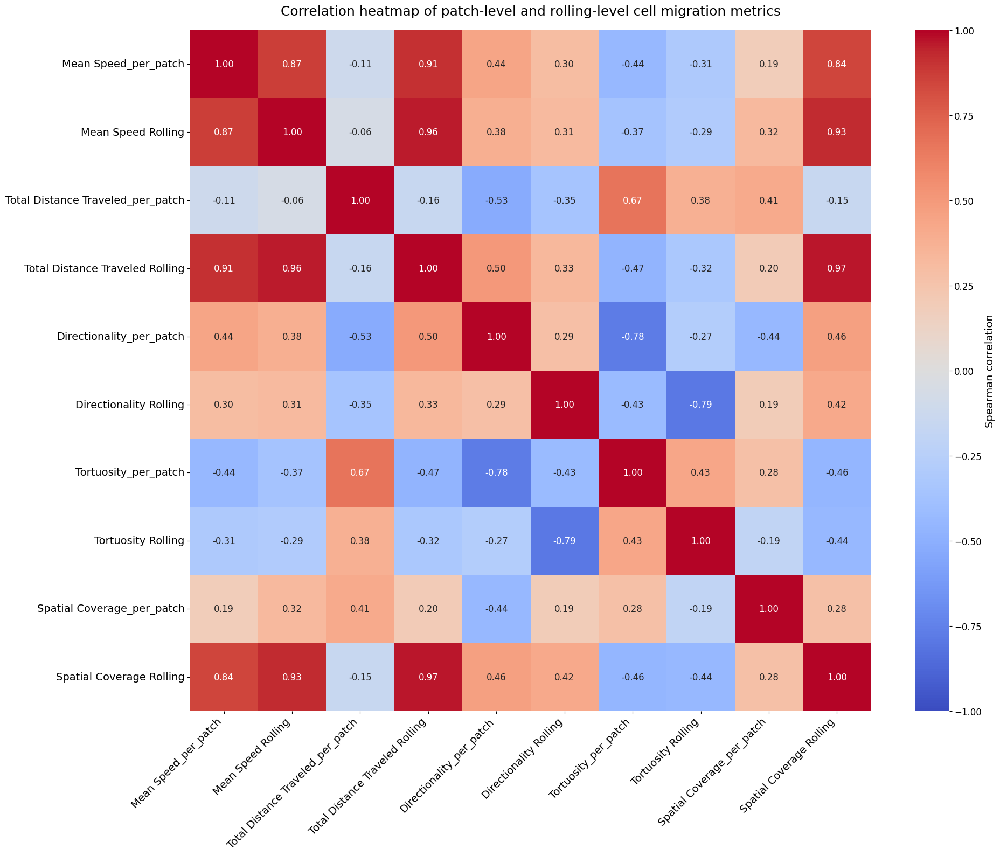

In [10]:
#final_df = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT-tracks_final.csv"))
#final_df = final_df[['AFT_eccentricity', 'intensity', 'density', 'order_value', 'HDM', 'endpoints', 'norm_endpoints', 'norm_branch', 'curvature_mean', 'branch_points', 'FFD', 'lacunarity', 'File_name', 'ECM_ID', 'FRAME', 'RADIUS', 'MEAN_INTENSITY_CH1', 'MEDIAN_INTENSITY_CH1', 'MIN_INTENSITY_CH1', 'MAX_INTENSITY_CH1', 'TOTAL_INTENSITY_CH1', 'STD_INTENSITY_CH1', 'CONTRAST_CH1', 'SNR_CH1', 'ELLIPSE_X0', 'ELLIPSE_Y0', 'ELLIPSE_MAJOR', 'ELLIPSE_MINOR', 'ELLIPSE_THETA', 'ELLIPSE_ASPECTRATIO', 'AREA', 'PERIMETER', 'CIRCULARITY', 'SOLIDITY', 'SHAPE_INDEX', 'Condition', 'AFT-AI', 'Mean Speed_per_patch', 'Max Speed_per_patch', 'Min Speed_per_patch', 'Median Speed_per_patch', 'Speed Standard Deviation_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 'Tortuosity_per_patch', 'FMI_x_plus_per_patch', 'FMI_x_minus_per_patch', 'FMI_y_plus_per_patch', 'FMI_y_minus_per_patch', 'dx' , 	'dy' , 	'dR_euclidean' , 	'instantaneous_speed' , 	'FMI_x_plus_spot' , 	'FMI_x_minus_spot' , 	'FMI_y_plus_spot' , 	'FMI_y_minus_spot' , 	'velocity_correlation_index_spot' , 	'velocity_correlation_index_track' , 	'disp_autocorr_spot' , 	'displacement_autocorrelation_function' , 	'average_traveled_distance' , 	'total_path_length' , 	'net_distance' , 	'FMI_x_plus_spot_per_patch' , 	'FMI_x_minus_spot_per_patch' , 	'FMI_y_plus_spot_per_patch' , 	'FMI_y_minus_spot_per_patch' , 	'dR_euclidean_per_patch' , 	'instantaneous_speed_per_patch' , 	'velocity_correlation_index_spot_per_patch' , 	'disp_autocorr_spot_per_patch' , 	'total_path_length_track_per_patch' , 	'displacement_autocorrelation_function_per_patch' ]]
#final_df = final_df[['AFT_eccentricity', 'intensity', 'density', 'order_value', 'HDM', 'endpoints', 'norm_endpoints', 'norm_branch', 'curvature_mean', 'branch_points', 'FFD', 'lacunarity', 'Condition', 'ECM_ID', 'File_name', 'ELLIPSE_X0', 'ELLIPSE_Y0', 'ELLIPSE_MAJOR', 'ELLIPSE_MINOR', 'ELLIPSE_THETA', 'ELLIPSE_ASPECTRATIO', 'AREA', 'PERIMETER', 'CIRCULARITY', 'SOLIDITY', 'SHAPE_INDEX', 'AFT-AI', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 'Tortuosity_per_patch', 'FMI_x_plus_per_patch', 'FMI_x_minus_per_patch', 'FMI_y_plus_per_patch', 'FMI_y_minus_per_patch', 'FMI_x_plus_spot_per_patch', 'FMI_x_minus_spot_per_patch', 'FMI_y_plus_spot_per_patch', 'FMI_y_minus_spot_per_patch', 'dR_euclidean_per_patch', 'instantaneous_speed_per_patch', 'velocity_correlation_index_spot_per_patch', 'disp_autocorr_spot_per_patch', 'total_path_length_track_per_patch', 'displacement_autocorrelation_function_per_patch', 'average_traveled_distance_per_patch', 'total_path_length_per_patch', 'Mean Speed Rolling', 'Max Speed Rolling' , 	'Min Speed Rolling Rolling' , 	'Median Speed Rolling' , 	'Speed Standard Deviation Rolling' , 	'Total Distance Traveled Rolling' , 	'Directionality Rolling' , 	'Tortuosity Rolling' , 	'Total Turning Angle Rolling' , 	'Spatial Coverage Rolling']]
#final_df = final_df[['AFT_eccentricity', 'intensity', 'density', 'order_value', 'HDM', 'endpoints', 'norm_endpoints', 'norm_branch', 'curvature_mean', 'branch_points', 'FFD', 'lacunarity', 'Condition', 'ECM_ID', 'File_name', 'ELLIPSE_X0', 'ELLIPSE_Y0', 'ELLIPSE_MAJOR', 'ELLIPSE_MINOR', 'ELLIPSE_THETA', 'ELLIPSE_ASPECTRATIO', 'AREA', 'PERIMETER', 'CIRCULARITY', 'SOLIDITY', 'SHAPE_INDEX', 'AFT-AI', 'Total Distance Traveled_per_patch', 'FMI_x_plus_per_patch', 'FMI_x_minus_per_patch', 'FMI_y_plus_per_patch', 'FMI_y_minus_per_patch', 'dR_euclidean_per_patch', 'instantaneous_speed_per_patch', 'velocity_correlation_index_spot_per_patch', 'disp_autocorr_spot_per_patch', 'displacement_autocorrelation_function_per_patch', 'average_traveled_distance_per_patch', 'Mean Speed Rolling', 'Max Speed Rolling' , 	'Min Speed Rolling Rolling' , 	'Median Speed Rolling' , 	'Speed Standard Deviation Rolling' , 'Directionality Rolling' , 'Tortuosity Rolling' , 'Total Turning Angle Rolling' , 'Spatial Coverage Rolling']]
'''
final_df = final_df[['AFT-AI', 'AFT_eccentricity', 'intensity', 'density', 'ECM_ID', 'order_value', 'FRAME', 'RADIUS', 'ELLIPSE_X0', 
                     'ELLIPSE_Y0', 'ELLIPSE_MAJOR', 'ELLIPSE_MINOR', 'ELLIPSE_THETA', 'ELLIPSE_ASPECTRATIO', 'AREA', 'PERIMETER', 'CIRCULARITY', 'SOLIDITY', 'SHAPE_INDEX', 
                     'Condition', 'File_name',
                     'Mean Speed_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 
                     'Tortuosity_per_patch', 'Total Turning Angle_per_patch', 'Spatial Coverage_per_patch', 'FMI_x_plus_per_patch', 'FMI_x_minus_per_patch', 
                     'FMI_y_plus_per_patch', 'FMI_y_minus_per_patch', 'dx', 'dy',
                     'velocity_correlation_index_spot', 'velocity_correlation_index_track', 'disp_autocorr_spot', 'displacement_autocorrelation_function', 
                     'average_traveled_distance', 'total_path_length', 'net_distance', 'dR_euclidean_per_patch', 'instantaneous_speed_per_patch', 'velocity_correlation_index_spot_per_patch', 
                     'disp_autocorr_spot_per_patch', 'total_path_length_track_per_patch', 'displacement_autocorrelation_function_per_patch', 
                     'average_traveled_distance_per_patch', 'total_path_length_per_patch']]

#morphological features and morpholgy 
final_df = final_df[['AFT-AI', 'AFT_eccentricity', 'ECM_ID', 'order_value',
                     'ELLIPSE_MAJOR', 'ELLIPSE_MINOR', 'ELLIPSE_THETA', 'ELLIPSE_ASPECTRATIO', 'AREA', 'PERIMETER', 'CIRCULARITY', 'SOLIDITY', 'SHAPE_INDEX', 
                     'Condition', 'File_name']]
'''
final_df = final_df[['Condition', 'ECM_ID', 'File_name', 
                     'Mean Speed_per_patch', 'Mean Speed Rolling',
                     'Total Distance Traveled_per_patch', 'Total Distance Traveled Rolling',
                     'Directionality_per_patch', 'Directionality Rolling',
                     'Tortuosity_per_patch', 'Tortuosity Rolling',
                     'Spatial Coverage_per_patch', 'Spatial Coverage Rolling',	
                    ]]


file_list = [
    'Control_R1_ctrl_R1_pos1',
    'Control_R1_ctrl_R1_pos2',
    'Control_R2_ctrl_R2_pos1',
    'Control_R2_ctrl_R2_pos2',
    'Control_R2_ctrl_R2_pos3',
    'Control_R2_ctrl_R2_pos4',
    'Control_R2_ctrl_R2_pos5',
    'siCCT8si5_R2_siCCT8si5_pos16',
    'siCCT8si5_R2_siCCT8si5_R2_pos17',
    'siCCT8si5_R2_siCCT8si5_R2_pos18',
    'siCCT8si5_R2_siCCT8si5_pos19',
    'siCCT8si5_R2_siCCT8si5_pos20',
    'siCCT8si5_R2_siCCT8si5_pos22'
]

final_df = final_df[final_df['File_name'].isin(file_list)].copy()

final_df = final_df.rename(columns={
    'AFT_eccentricity': 'eccentricity'})
#final_df = (final_df.groupby(['Condition', 'File_name', 'ECM_ID'], as_index=False).mean(numeric_only=True))
final_df = final_df.drop(columns=['ECM_ID', 'File_name'])

#final_df = final_df[final_df['File_name'].isin(file_list)].copy()

df_control = final_df[final_df['Condition'] == 'Control']
df_si = final_df[final_df['Condition'] == 'siCCT8si5']

numeric_cols = df_si.select_dtypes(include='number').columns
corr = df_si[numeric_cols].corr(method='spearman')

plt.figure(figsize=(20, 16))

ax = sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    square=True,
    annot_kws={"size": 12},
    cbar_kws={'label': 'Spearman correlation'}
)

ax.set_xticklabels(ax.get_xticklabels(), fontsize=14, rotation=45, ha='right')
ax.set_yticklabels(ax.get_yticklabels(), fontsize=14, rotation=0)

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=12)
cbar.set_label('Spearman correlation', fontsize=14)

plt.title(
    "Correlation heatmap of patch-level and rolling-level cell migration metrics",
    fontsize=18, pad=20
)

plt.tight_layout()
plt.show()



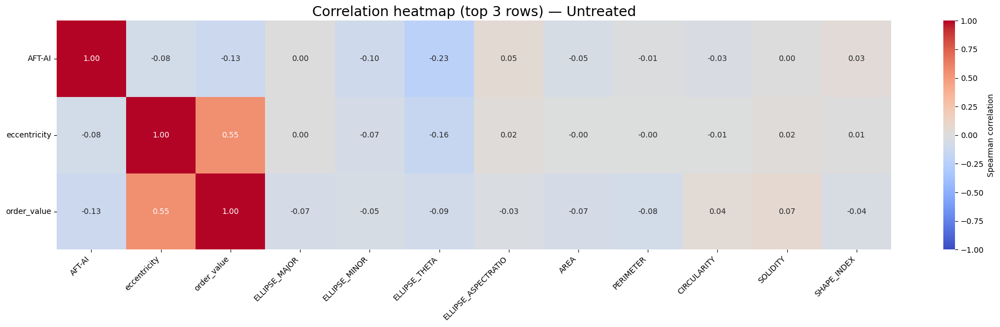

In [144]:
# корреляционная матрица
corr = df_control[numeric_cols].corr(method='spearman')

# оставить только верхние 3 строки
corr_top3 = corr.iloc[:3, :]

plt.figure(figsize=(20, 6))

sns.heatmap(
    corr_top3,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    square=False,          # важно: иначе будет плохо выглядеть
    cbar_kws={'label': 'Spearman correlation'}
)

plt.title("Correlation heatmap (top 3 rows) — Untreated", fontsize=18)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

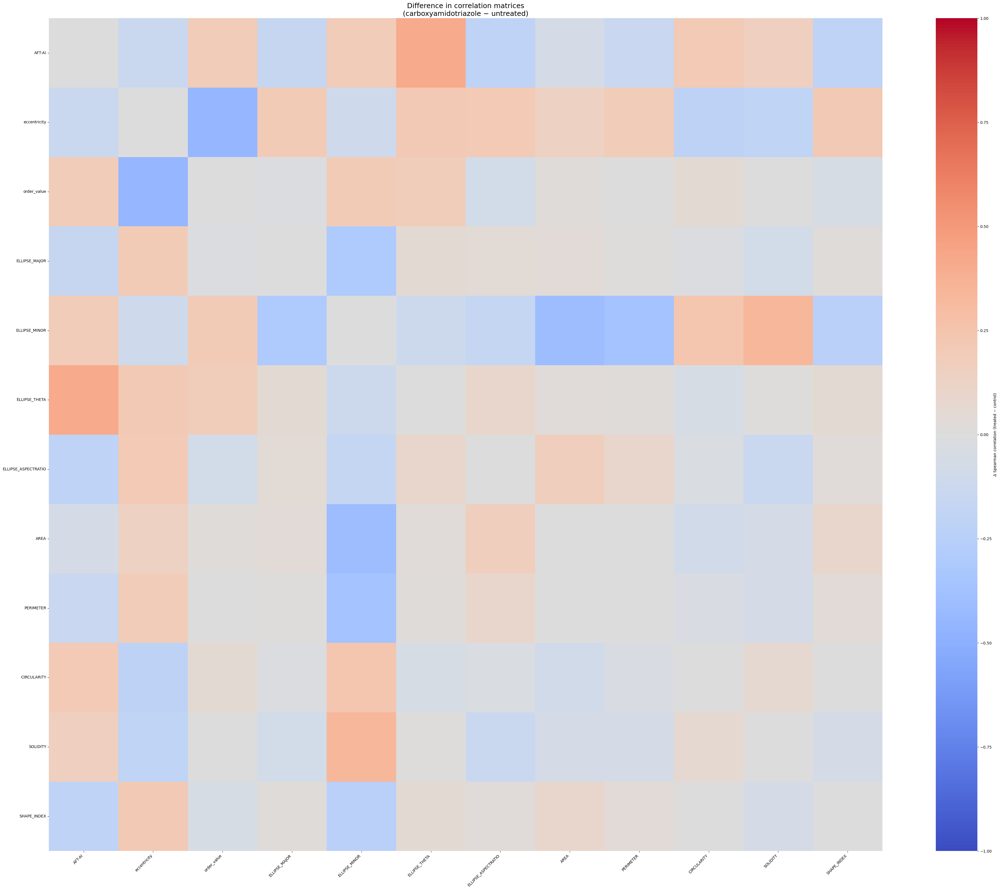

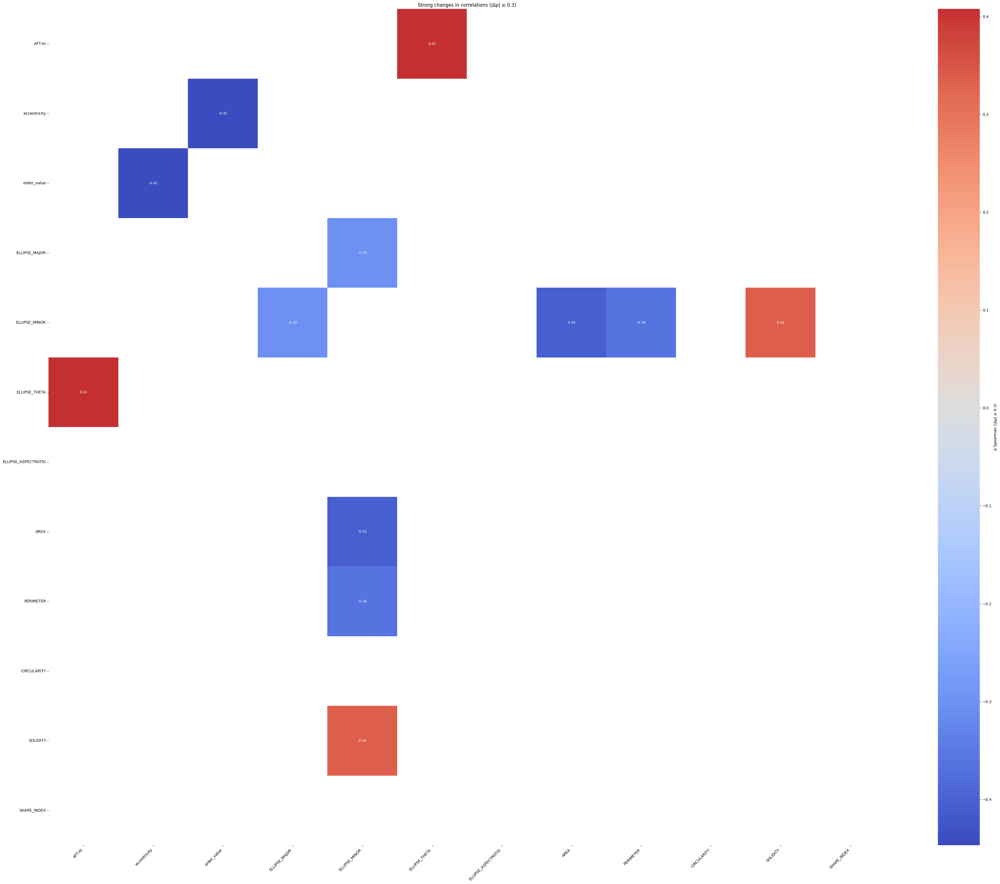

In [ ]:
# --- корреляции ---
numeric_cols = final_df.select_dtypes(include='number').columns

corr_control = (
    final_df[final_df['Condition'] == 'untreated'][numeric_cols]
    .corr(method='spearman')
)

corr_si = (
    final_df[final_df['Condition'] == 'carboxyamidotriazole'][numeric_cols]
    .corr(method='spearman')
)

# --- разница корреляций ---
corr_diff = corr_si - corr_control
plt.figure(figsize=(40, 32))

sns.heatmap(
    corr_diff,
    cmap='coolwarm',
    center=0,          # <-- критично для интерпретации
    vmin=-1,
    vmax=1,
    square=True,
    cbar_kws={'label': 'Δ Spearman correlation (treated − control)'}
)

plt.title(
    "Difference in correlation matrices\n(carboxyamidotriazole − untreated)",
    fontsize=18
)

plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()
corr_diff_filtered = corr_diff.where(corr_diff.abs() >= 0.3)

plt.figure(figsize=(40, 32))

sns.heatmap(
    corr_diff_filtered,
    cmap='coolwarm',
    center=0,
    square=True,
    annot=True,
    fmt=".2f",
    annot_kws={"size": 9},
    cbar_kws={'label': 'Δ Spearman (|Δρ| ≥ 0.3)'}
)

plt.title("Strong changes in correlations (|Δρ| ≥ 0.3)")
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



In [11]:
!pip install statsmodels
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

#final_df = final_df.drop(columns=['AFT_track_angle', 'AFT_track_angle_cos2', 'ID', 'QUALITY', 'ECM_x', 'ECM_y', 'AFT-Δφ', 'intensity', 'density', 'order_value'])
# --- настройки ---
alpha = 0.05

# проверка количества групп
conditions = final_df['Condition'].dropna().unique()
assert len(conditions) == 2, f"Ожидается 2 Condition, найдено: {conditions}"

cond1, cond2 = conditions

# числовые признаки
numeric_cols = final_df.select_dtypes(include='number').columns

results = []

for col in numeric_cols:
    x = final_df.loc[final_df['Condition'] == cond1, col].dropna()
    y = final_df.loc[final_df['Condition'] == cond2, col].dropna()
    print(f"Column {col}: NaNs in x = {x.isna().sum()}, NaNs in y = {y.isna().sum()}")
    print("SHAPE x:", x.shape)
    print("SHAPE y:", y.shape)
    if x.isna().sum() > 0 or y.isna().sum() > 0:
        print(f"Column {col}: NaNs in x = {x.isna().sum()}, NaNs in y = {y.isna().sum()}")
        print("NaNs in x:", x.shape)
        print("NaNs in y:", y.shape)
    stat, p = mannwhitneyu(x, y, alternative='two-sided')

    results.append({
        'Feature': col,
        'U_statistic': stat,
        'p_value': p,
        'median_' + str(cond1): np.median(x),
        'median_' + str(cond2): np.median(y)
    })

results_df = pd.DataFrame(results)

# FDR correction
results_df['p_adj'] = multipletests(
    results_df['p_value'],
    method='bonferroni'
)[1]

# значимые признаки
significant_df = results_df[results_df['p_adj'] < alpha] \
    .sort_values('p_adj')

significant_features = significant_df['Feature'].tolist()
print("Significant features (FDR < 0.05):")
for f in significant_features:
    print(f)
results_df[['Feature', 'p_value', 'p_adj']].sort_values('p_value').head(10)




[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: pip install --upgrade pip
Column Mean Speed_per_patch: NaNs in x = 0, NaNs in y = 0
SHAPE x: (18389,)
SHAPE y: (8303,)
Column Mean Speed Rolling: NaNs in x = 0, NaNs in y = 0
SHAPE x: (18239,)
SHAPE y: (8163,)
Column Total Distance Traveled_per_patch: NaNs in x = 0, NaNs in y = 0
SHAPE x: (18450,)
SHAPE y: (8331,)
Column Total Distance Traveled Rolling: NaNs in x = 0, NaNs in y = 0
SHAPE x: (18239,)
SHAPE y: (8163,)
Column Directionality_per_patch: NaNs in x = 0, NaNs in y = 0
SHAPE x: (18389,)
SHAPE y: (8303,)
Column Directionality Rolling: NaNs in x = 0, NaNs in y = 0
SHAPE x: (18309,)
SHAPE y: (8223,)
Column Tortuosity_per_patch: NaNs in x = 0, NaNs in y = 0
SHAPE x: (18389,)
SHAPE y: (8303,)
Column Tortuosity Rolling: NaNs in x = 0, NaNs in y = 0
SHAPE x: (18309,)
SHAPE y: (8223,)
Column Spatial Coverage_per_patch: NaNs in x = 0, NaNs in y = 0
SHAPE x: (18389,)
SHAPE y: (8303,)
Column Spatial Cover

,Feature,p_value,p_adj
0,Mean Speed_per_patch,1.829763e-181,1.829763e-180
3,Total Distance Traveled Rolling,9.919289e-145,9.919289e-144
1,Mean Speed Rolling,1.659409e-142,1.659409e-141
9,Spatial Coverage Rolling,2.065587e-136,2.065587e-135
2,Total Distance Traveled_per_patch,3.188657e-51,3.188657e-50
6,Tortuosity_per_patch,3.599620e-49,3.599620e-48
8,Spatial Coverage_per_patch,5.740152e-39,5.740152e-38
7,Tortuosity Rolling,1.797523e-09,1.797523e-08
4,Directionality_per_patch,4.265119e-06,4.265119e-05
5,Directionality Rolling,7.210688e-03,7.210688e-02


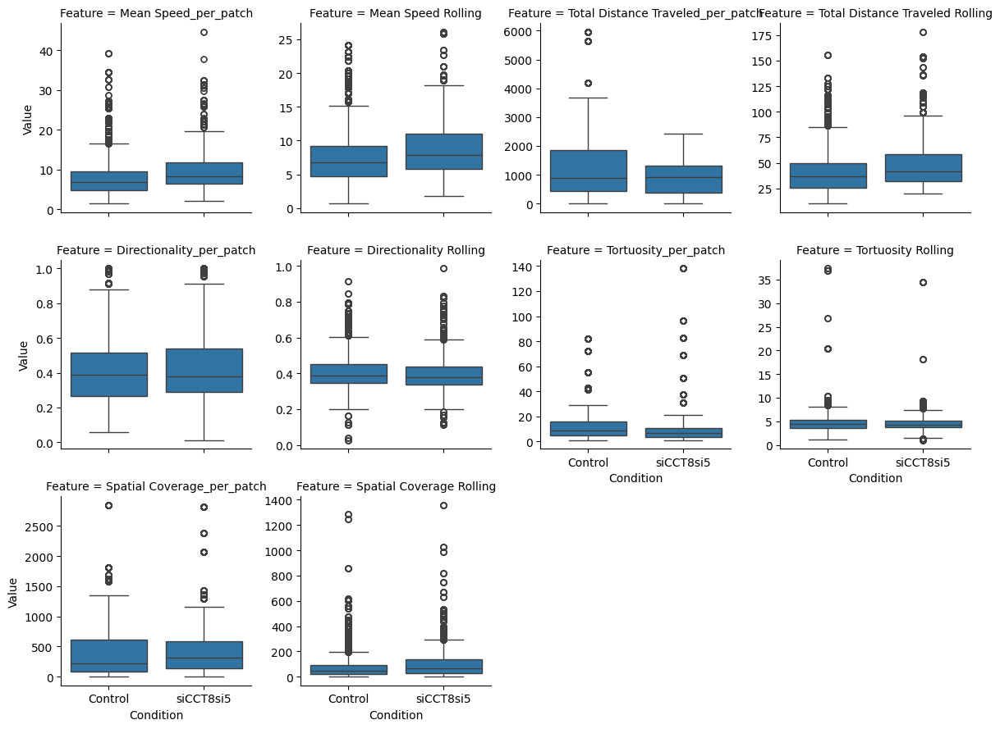

In [12]:
numeric_cols = final_df.select_dtypes(include='number').columns

df_long = final_df.melt(
    id_vars='Condition',
    value_vars=numeric_cols,
    var_name='Feature',
    value_name='Value'
)

features = list(numeric_cols)

for i in range(0, len(features), 12):
    subset = features[i:i+12]
    

    df_sub = final_df.melt(
        id_vars='Condition',
        value_vars=subset,
        var_name='Feature',
        value_name='Value'
    )
    df_sub = df_sub.dropna(subset=['Value'])
    sns.catplot(
        data=df_sub,
        x='Condition',
        y='Value',
        col='Feature',
        kind='box',
        col_wrap=4,
        sharey=False,
        height=3
    )

    plt.show()


#Убрать высоко кор признаки, которые означают одно и то же 
#убрать всякие интенсивности каналов и вот эту шваль
#сгруппировать по ECM_ID (взять mean у признаков)

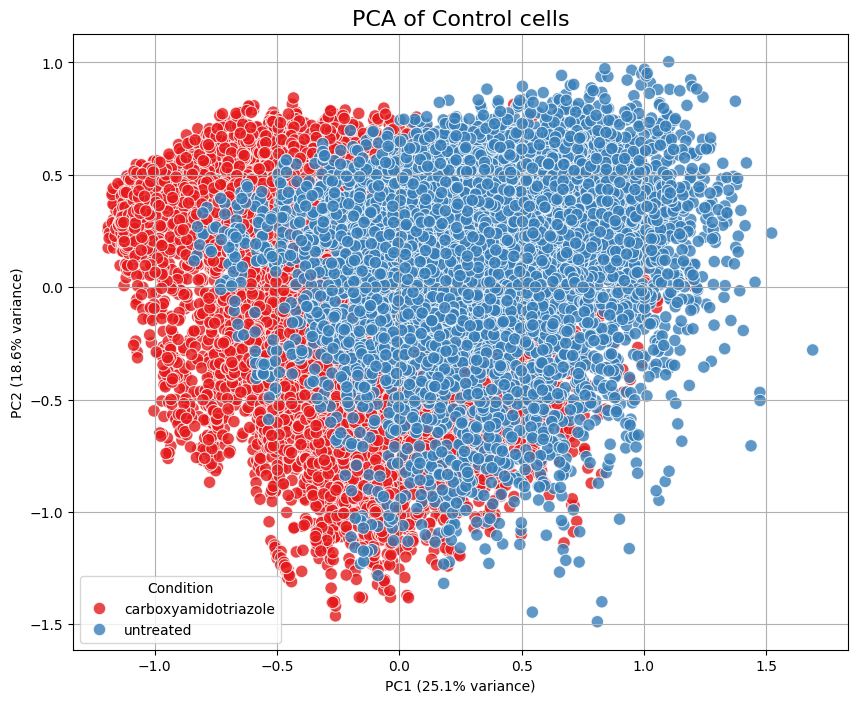

Explained variance ratio: [0.25094207 0.18630638]


In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
import seaborn as sns
import matplotlib.pyplot as plt
#final_df = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT-tracks_final.csv"))

#final_df = final_df[['AFT_eccentricity', 'HDM', 'norm_endpoints', 'norm_branch', 'lacunarity', 'ELLIPSE_THETA', 'Condition', 'AFT-AI', 'Mean Speed_per_patch', 
#                     'Directionality_per_patch', 'Tortuosity_per_patch',   
#                     'total_path_length' ,    'velocity_correlation_index_spot_per_patch']]

#final_df = final_df[['AFT_eccentricity', 'intensity', 'density', 'order_value', 'HDM', 'endpoints', 'norm_endpoints', 'norm_branch', 'curvature_mean', 'branch_points', 'FFD', 'lacunarity', 'File_name', 'ECM_ID', 'FRAME', 'RADIUS', 'MEAN_INTENSITY_CH1', 'MEDIAN_INTENSITY_CH1', 'MIN_INTENSITY_CH1', 'MAX_INTENSITY_CH1', 'TOTAL_INTENSITY_CH1', 'STD_INTENSITY_CH1', 'CONTRAST_CH1', 'SNR_CH1', 'ELLIPSE_X0', 'ELLIPSE_Y0', 'ELLIPSE_MAJOR', 'ELLIPSE_MINOR', 'ELLIPSE_THETA', 'ELLIPSE_ASPECTRATIO', 'AREA', 'PERIMETER', 'CIRCULARITY', 'SOLIDITY', 'SHAPE_INDEX', 'Condition', 'AFT-AI', 'Mean Speed_per_patch', 'Max Speed_per_patch', 'Min Speed_per_patch', 'Median Speed_per_patch', 'Speed Standard Deviation_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 'Tortuosity_per_patch', 'FMI_x_plus_per_patch', 'FMI_x_minus_per_patch', 'FMI_y_plus_per_patch', 'FMI_y_minus_per_patch', 'dx' , 	'dy' , 	'dR_euclidean' , 	'instantaneous_speed' , 	'FMI_x_plus_spot' , 	'FMI_x_minus_spot' , 	'FMI_y_plus_spot' , 	'FMI_y_minus_spot' , 	'velocity_correlation_index_spot' , 	'velocity_correlation_index_track' , 	'disp_autocorr_spot' , 	'displacement_autocorrelation_function' , 	'average_traveled_distance' , 	'total_path_length' , 	'net_distance' , 	'FMI_x_plus_spot_per_patch' , 	'FMI_x_minus_spot_per_patch' , 	'FMI_y_plus_spot_per_patch' , 	'FMI_y_minus_spot_per_patch' , 	'dR_euclidean_per_patch' , 	'instantaneous_speed_per_patch' , 	'velocity_correlation_index_spot_per_patch' , 	'disp_autocorr_spot_per_patch' , 	'total_path_length_track_per_patch' , 	'displacement_autocorrelation_function_per_patch' ]]

#final_df = final_df[['AFT_eccentricity', 'HDM', 'norm_branch', 'lacunarity', 'Condition', 'Mean Speed_per_patch', 
#                     'Directionality_per_patch',
#                     'total_path_length' ,    'velocity_correlation_index_spot_per_patch']]
final_df = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT_final.csv"))
'''
final_df = final_df[['AFT-AI', 'AFT_eccentricity', 'ECM_ID', 'order_value', 'FRAME', 'RADIUS', 'ELLIPSE_X0', 
                     'ELLIPSE_Y0', 'ELLIPSE_MAJOR', 'ELLIPSE_MINOR', 'ELLIPSE_THETA', 'ELLIPSE_ASPECTRATIO', 'AREA', 'PERIMETER', 'CIRCULARITY', 'SOLIDITY', 'SHAPE_INDEX', 
                     'Condition', 'File_name',
                     'Mean Speed_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 
                     'Tortuosity_per_patch', 'Total Turning Angle_per_patch', 'Spatial Coverage_per_patch',
                     'velocity_correlation_index_spot', 'velocity_correlation_index_track', 'disp_autocorr_spot', 'displacement_autocorrelation_function', 
                     'dR_euclidean_per_patch', 'instantaneous_speed_per_patch', 'velocity_correlation_index_spot_per_patch', 
                     'disp_autocorr_spot_per_patch', 'total_path_length_track_per_patch', 'displacement_autocorrelation_function_per_patch', 
                     'average_traveled_distance_per_patch', 'total_path_length_per_patch']]

final_df = final_df[['AFT-AI', 'AFT_eccentricity', 'ECM_ID',
                     'ELLIPSE_ASPECTRATIO', 'PERIMETER', 'CIRCULARITY',
                     'Condition', 'File_name']]
'''
#final_df = (final_df.groupby(['Condition', 'File_name', 'ECM_ID'], as_index=False).mean(numeric_only=True))
final_df = final_df.drop(columns=['ECM_ID'])

df_control = final_df[final_df['Condition'] == 'untreated']
df_si = final_df[final_df['Condition'] == 'carboxyamidotriazole']


numeric_cols = final_df.select_dtypes(include='number').columns
df_numeric = final_df[numeric_cols]


imputer = SimpleImputer(strategy='median')
df_imputed = imputer.fit_transform(df_numeric)


scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_imputed)


pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_scaled)


pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
pca_df['Condition'] = final_df['Condition'].values

feature_names = numeric_cols

loadings = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=feature_names
)

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='PC1', y='PC2',
    hue='Condition',
    data=pca_df,
    palette='Set1',
    s=80,
    alpha=0.8
)
plt.title("PCA of Control cells", fontsize=16)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)")
plt.grid(True)
plt.show()

print("Explained variance ratio:", pca.explained_variance_ratio_)


In [131]:
loadings_sorted = loadings.copy()
for pc in ['PC1', 'PC2']:
    loadings_sorted[pc + '_abs'] = loadings_sorted[pc].abs()

loadings_sorted = loadings_sorted.sort_values(
    by=['PC1_abs', 'PC2_abs'],
    ascending=False
)

loadings_sorted[['PC1', 'PC2']].head(60)

,PC1,PC2
CIRCULARITY,0.615050,-0.258356
ELLIPSE_ASPECTRATIO,-0.493553,0.187469
PERIMETER,-0.407783,0.159878
AFT-AI,0.366769,0.919049
AREA,-0.258837,0.123254
AFT_eccentricity,-0.101566,-0.112712


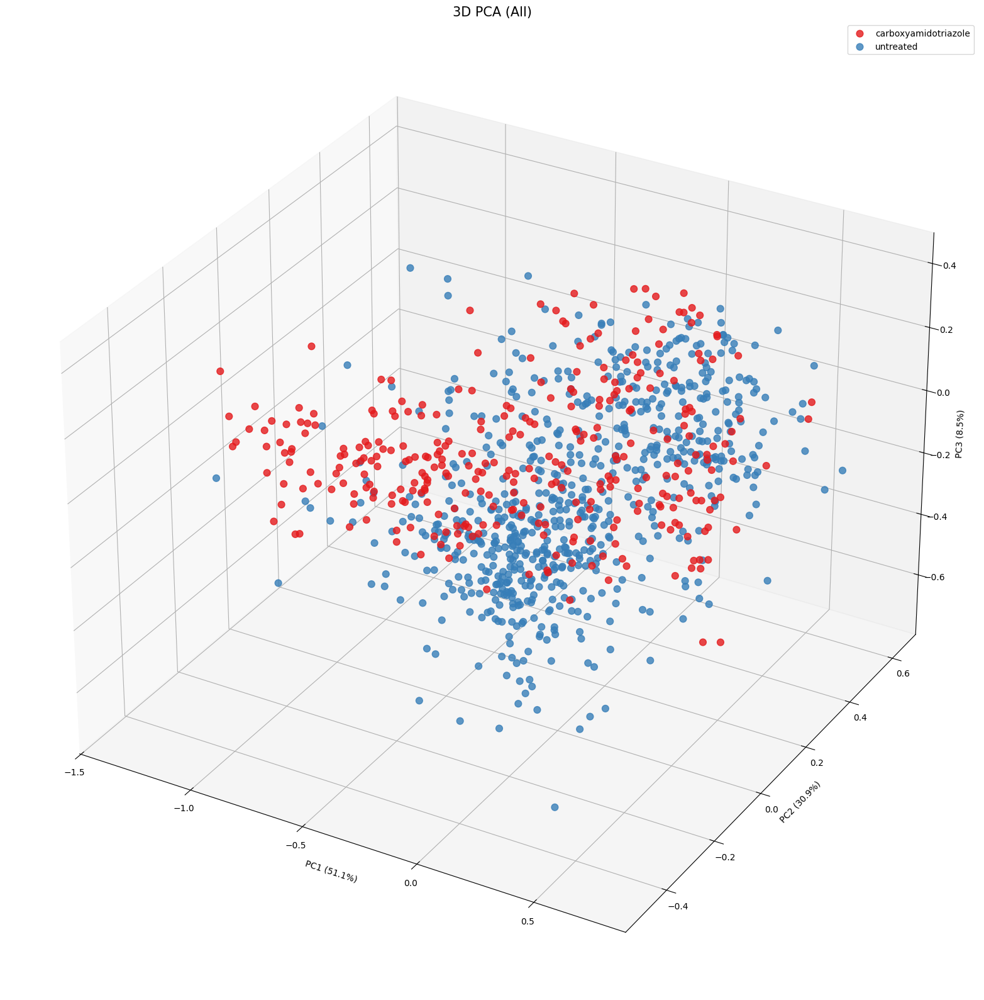

Explained variance ratio: [0.5110947  0.30887836 0.08539811]
Cumulative variance: 0.9053711710775441


In [121]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa
import seaborn as sns
final_df = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT_final.csv"))
'''
final_df = final_df[['AFT-AI', 'AFT_eccentricity', 'ECM_ID', 'order_value', 'FRAME', 'RADIUS', 'ELLIPSE_X0', 
                     'ELLIPSE_Y0', 'ELLIPSE_MAJOR', 'ELLIPSE_MINOR', 'ELLIPSE_THETA', 'ELLIPSE_ASPECTRATIO', 'AREA', 'PERIMETER', 'CIRCULARITY', 'SOLIDITY', 'SHAPE_INDEX', 
                     'Condition', 'File_name',
                     'Mean Speed_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 
                     'Tortuosity_per_patch', 'Total Turning Angle_per_patch', 'Spatial Coverage_per_patch',
                     'velocity_correlation_index_spot', 'velocity_correlation_index_track', 'disp_autocorr_spot', 'displacement_autocorrelation_function', 
                     'dR_euclidean_per_patch', 'instantaneous_speed_per_patch', 'velocity_correlation_index_spot_per_patch', 
                     'disp_autocorr_spot_per_patch', 'total_path_length_track_per_patch', 'displacement_autocorrelation_function_per_patch', 
                     'average_traveled_distance_per_patch', 'total_path_length_per_patch']]
'''
final_df = final_df[['AFT-AI', 'AFT_eccentricity', 'ECM_ID', 'order_value',
                     'ELLIPSE_ASPECTRATIO', 'AREA', 'PERIMETER', 'CIRCULARITY', 'SOLIDITY', 'SHAPE_INDEX', 
                     'Condition', 'File_name']]
final_df = (final_df.groupby(['Condition', 'File_name', 'ECM_ID'], as_index=False).mean(numeric_only=True))
final_df = final_df.drop(columns=['ECM_ID'])

# числовые колонки
numeric_cols = final_df.select_dtypes(include='number').columns
df_numeric = final_df[numeric_cols]

# imputation
imputer = SimpleImputer(strategy='median')
df_imputed = imputer.fit_transform(df_numeric)

# scaling
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_imputed)

# PCA (3 компоненты)
pca = PCA(n_components=3)
pca_result = pca.fit_transform(df_scaled)
# названия признаков
feature_names = numeric_cols

# loadings = вклад признаков
loadings = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2', 'PC3'],
    index=feature_names
)
# DataFrame
pca_df = pd.DataFrame(
    pca_result,
    columns=['PC1', 'PC2', 'PC3']
)
pca_df['Condition'] = final_df['Condition'].values
fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')

conditions = pca_df['Condition'].unique()
palette = sns.color_palette('Set1', len(conditions))

for cond, color in zip(conditions, palette):
    subset = pca_df[pca_df['Condition'] == cond]
    ax.scatter(
        subset['PC1'],
        subset['PC2'],
        subset['PC3'],
        label=cond,
        s=60,
        alpha=0.8,
        color=color
    )

ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
ax.set_zlabel(f"PC3 ({pca.explained_variance_ratio_[2]*100:.1f}%)")

ax.set_title("3D PCA (All)", fontsize=15)
ax.legend()
plt.tight_layout()
plt.show()
print("Explained variance ratio:", pca.explained_variance_ratio_)
print(
    "Cumulative variance:",
    pca.explained_variance_ratio_.sum()
)


In [122]:
loadings_sorted = loadings.copy()
for pc in ['PC1', 'PC2', 'PC3']:
    loadings_sorted[pc + '_abs'] = loadings_sorted[pc].abs()

loadings_sorted = loadings_sorted.sort_values(
    by=['PC1_abs', 'PC2_abs', 'PC3_abs'],
    ascending=False
)

loadings_sorted[['PC1', 'PC2', 'PC3']].head(60)


,PC1,PC2,PC3
CIRCULARITY,0.540250,-0.081797,-0.002817
SHAPE_INDEX,-0.461440,0.039732,-0.005875
ELLIPSE_ASPECTRATIO,-0.426733,0.046234,0.028216
PERIMETER,-0.356263,0.043272,-0.043986
SOLIDITY,0.352188,-0.025676,0.052621
AREA,-0.216492,0.046517,-0.063067
AFT-AI,0.111244,0.982652,0.143758
AFT_eccentricity,-0.053023,-0.137803,0.964641
order_value,-0.009327,-0.017393,0.198194


In [80]:
final_df = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT-tracks_final.csv"))

# @title ##Calculate the spatial coverage per ECM patch
from celltracks.Track_Metrics import calculate_spatial_coverage

print("In progress...")

tqdm.pandas(desc="Calculating Spatial Coverage")

df_spatial_coverage = final_df.copy()

df_spatial_coverage.sort_values(by=['Unique_ID', 'ECM_ID', 'POSITION_T', 'segment'], inplace=True)

valid_groups_list = []
invalid_groups_list = []
for (unique_id, ecm_id, segment), group in df_spatial_coverage.groupby(['Unique_ID', 'ECM_ID', 'segment']):
    if group['POSITION_T'].nunique() >= 2:
        valid_groups_list.append(group)
    else:
        invalid_groups_list.append(group)
print(f"Number of valid groups: {len(valid_groups_list)}")
print(f"Number of invalid groups: {len(invalid_groups_list)}")

df_spatial_coverage = pd.concat(valid_groups_list, ignore_index=True)

df_spatial_coverage = df_spatial_coverage.groupby(['Unique_ID', 'ECM_ID', 'segment']).progress_apply(calculate_spatial_coverage).reset_index()
final_df = pd.merge(final_df, df_spatial_coverage, on=['Unique_ID', 'ECM_ID', 'segment'], how='left')
cols = ['Spatial Coverage']
segment_values = final_df.drop_duplicates(subset=['Unique_ID', 'ECM_ID', 'segment'])[cols + ['File_name','ECM_ID']]

patch_mean = (segment_values.groupby(['File_name', 'ECM_ID'])[cols].mean().reset_index())
patch_mean.columns = ['File_name', 'ECM_ID'] + [f'{i}_per_patch' for i in cols]

final_df = pd.merge(final_df, patch_mean, on=['File_name', 'ECM_ID'], how='left')
#merged_spots_df.drop(columns=cols, inplace=True)

#overlapping_columns = merged_tracks_df.columns.intersection(df_spatial_coverage.columns).drop(['Unique_ID', 'ECM_ID'])
#merged_tracks_df.drop(columns=overlapping_columns, inplace=True)
#merged_tracks_df = pd.merge(merged_tracks_df, df_spatial_coverage, on=['Unique_ID', 'ECM_ID'], how='left')

#save_dataframe_with_progress(merged_tracks_df, Results_Folder + '/' + 'merged_Tracks.csv.gz')

#check_for_nans(merged_tracks_df, "merged_tracks_df")
merged_spots_df.rename(columns={
    "Spatial Coverage": 'Spatial_Coverage_per_segment'
}, inplace=False)
print("...Done")


In progress...
Number of valid groups: 4313
Number of invalid groups: 0


Calculating Spatial Coverage:   0%|          | 0/4313 [00:00<?, ?it/s]

...Done


/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/tqdm/std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)



[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: pip install --upgrade pip


/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


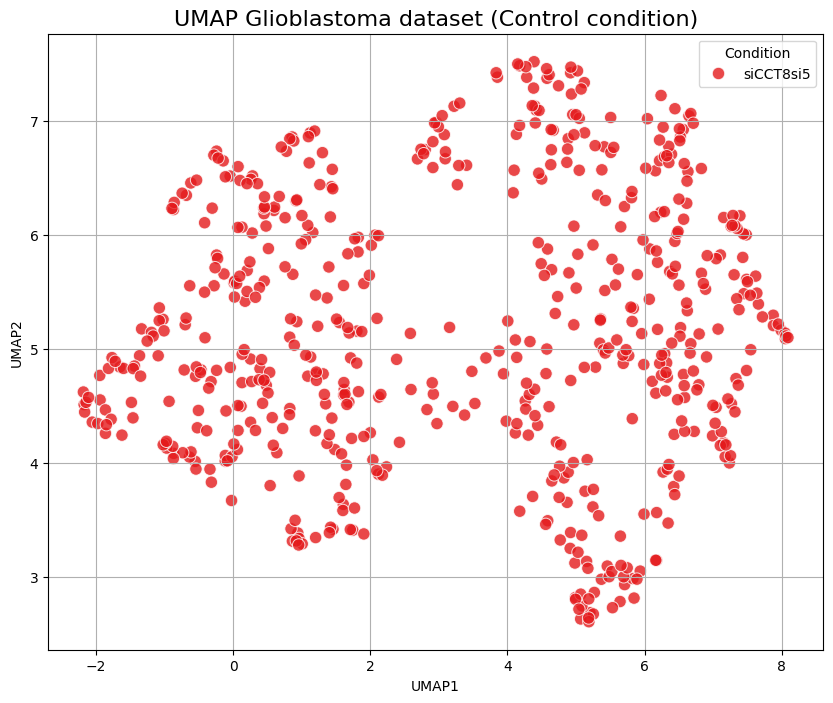

In [74]:
!pip install umap-learn
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
import umap
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

#final_df = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT-tracks_final.csv"))
'''
final_df = final_df[['AFT-AI', 'AFT_eccentricity', 'ECM_ID', 'order_value', 'FRAME', 'RADIUS', 'ELLIPSE_X0', 
                     'ELLIPSE_Y0', 'ELLIPSE_MAJOR', 'ELLIPSE_MINOR', 'ELLIPSE_THETA', 'ELLIPSE_ASPECTRATIO', 'AREA', 'PERIMETER', 'CIRCULARITY', 'SOLIDITY', 'SHAPE_INDEX', 
                     'Condition', 'File_name',
                     'Mean Speed_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 
                     'Tortuosity_per_patch', 'Total Turning Angle_per_patch', 'Spatial Coverage_per_patch',
                     'velocity_correlation_index_spot', 'velocity_correlation_index_track', 'disp_autocorr_spot', 'displacement_autocorrelation_function', 
                     'dR_euclidean_per_patch', 'instantaneous_speed_per_patch', 'velocity_correlation_index_spot_per_patch', 
                     'disp_autocorr_spot_per_patch', 'total_path_length_track_per_patch', 'displacement_autocorrelation_function_per_patch', 
                     'average_traveled_distance_per_patch', 'total_path_length_per_patch']]

final_df = final_df[['AFT-AI', 'ECM_ID',
                     'ELLIPSE_ASPECTRATIO',
                     'Condition', 'File_name']]
'''
final_df = (final_df.groupby(['Condition', 'File_name', 'ECM_ID'], as_index=False).mean(numeric_only=True))
final_df = final_df[['Condition', 'ECM_ID', 'File_name', 'AFT-AI', 'AFT_eccentricity', 'intensity', 'order_value', 'HDM', 'lacunarity', 'FFD', 'endpoints', 'norm_endpoints', 'branch_points', 'norm_branch', 'Mean Speed_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 
                     'Tortuosity_per_patch', 'Spatial Coverage_per_patch']]

final_df = final_df.drop(columns=['File_name', 'ECM_ID'])

df_control = final_df[final_df['Condition'] == 'Control']
df_si = final_df[final_df['Condition'] == 'siCCT8si5']

# числовые колонки
numeric_cols = df_si.select_dtypes(include='number').columns
df_numeric = df_si[numeric_cols]

# imputation
imputer = SimpleImputer(strategy='median')
df_imputed = imputer.fit_transform(df_numeric)

# scaling
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_imputed)

# UMAP
umap_model = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=2,
    metric='euclidean',
    random_state=42
)

umap_result = umap_model.fit_transform(df_scaled)

# DataFrame для визуализации
umap_df = pd.DataFrame(umap_result, columns=['UMAP1', 'UMAP2'])
umap_df['Condition'] = df_si['Condition'].values

# Plot
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='UMAP1', y='UMAP2',
    hue='Condition',
    data=umap_df,
    palette='Set1',
    s=80,
    alpha=0.8
)

plt.title("UMAP Glioblastoma dataset (Control condition)", fontsize=16)
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.grid(True)
plt.show()


/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


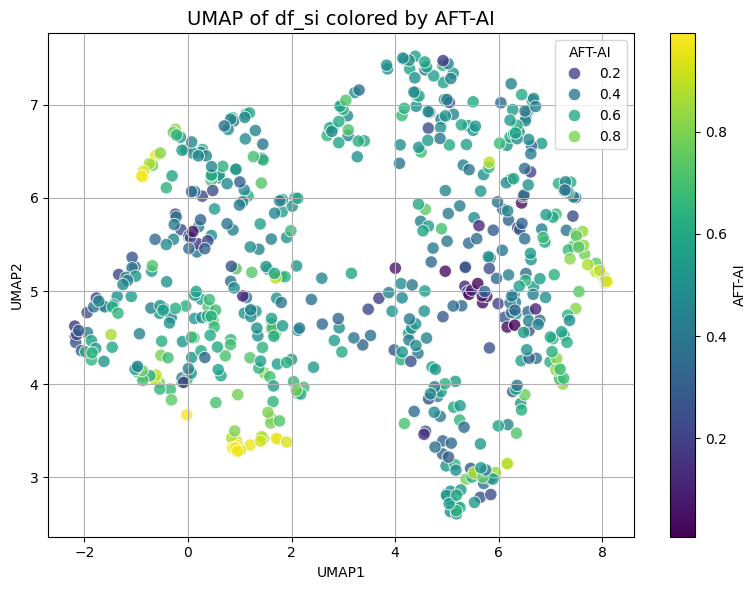

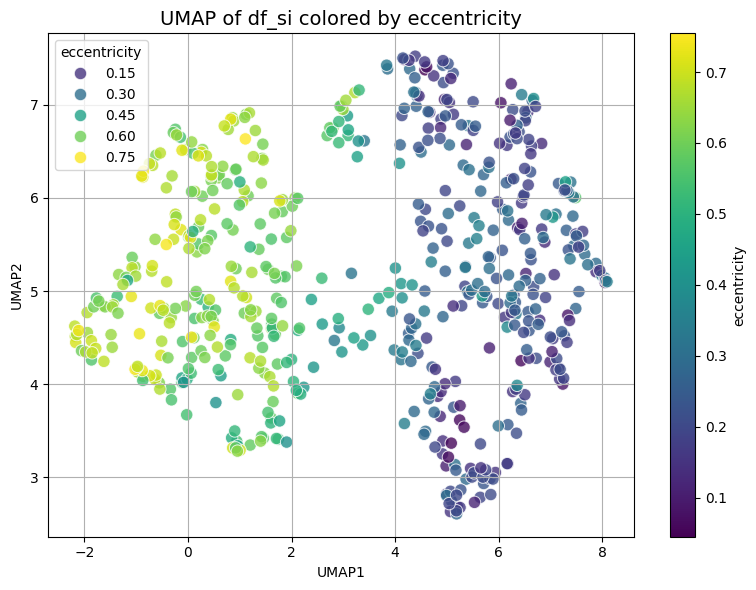

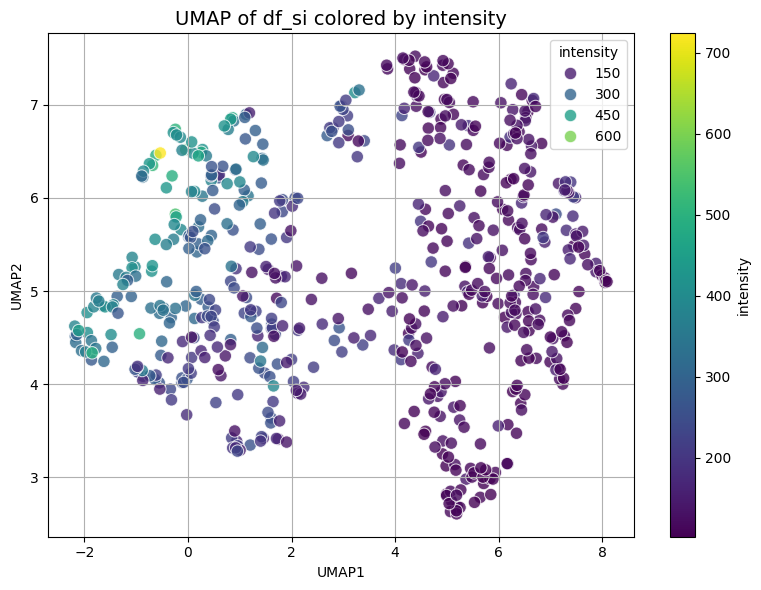

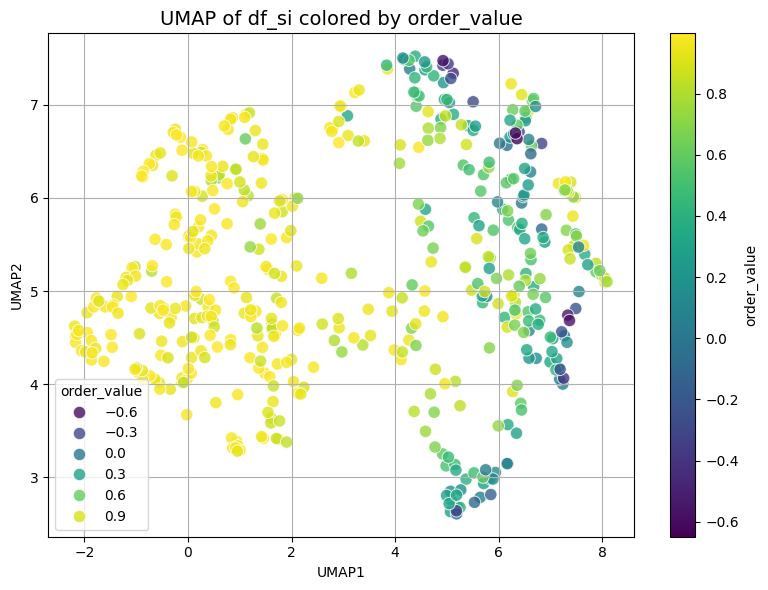

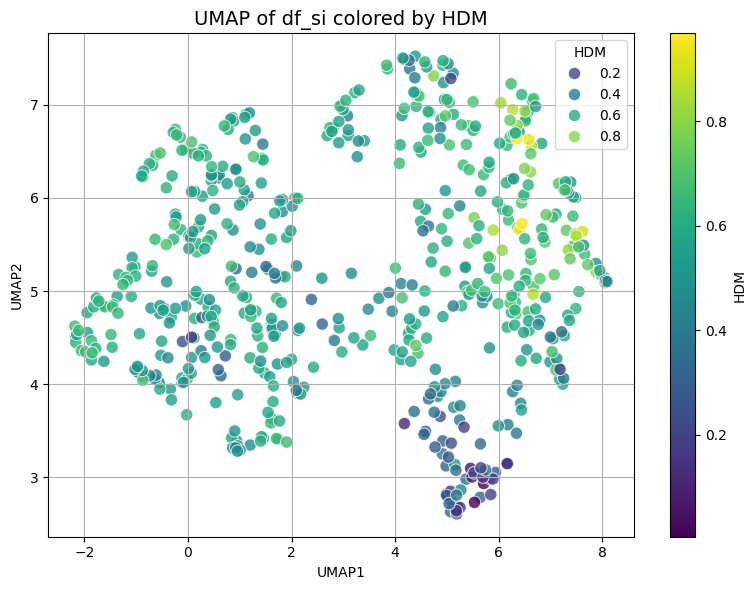

...

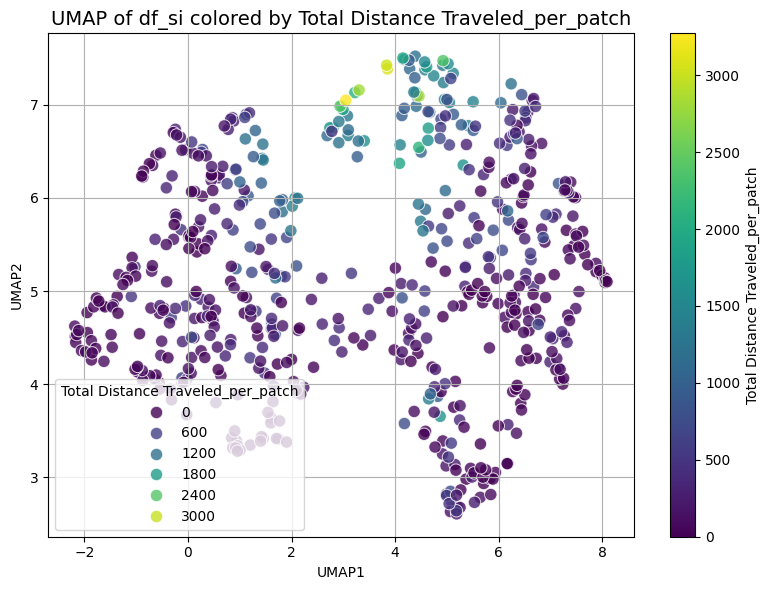

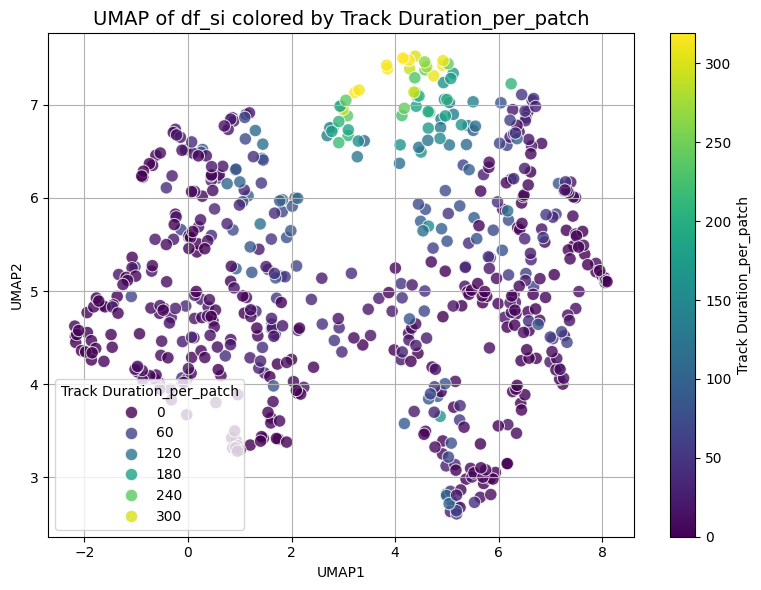

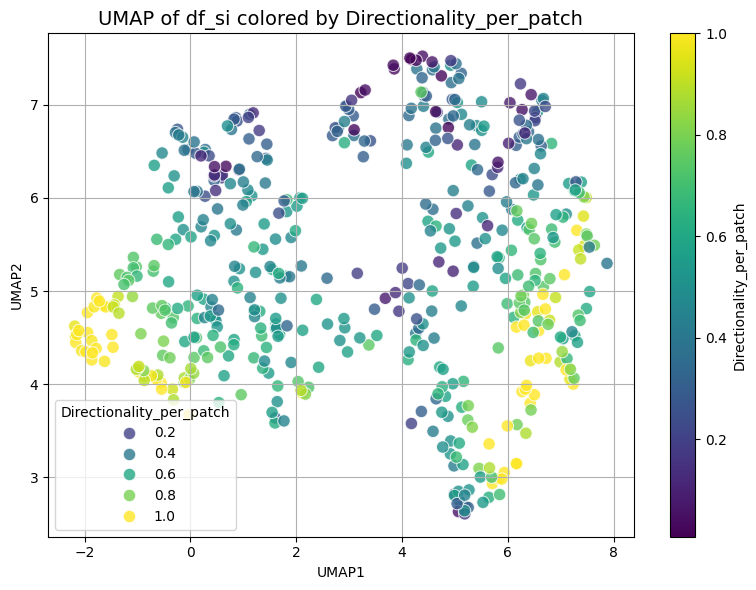

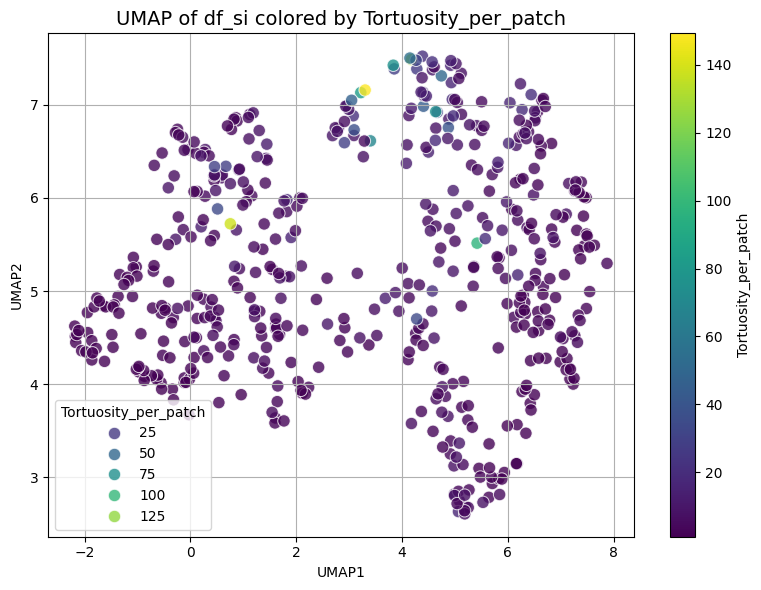

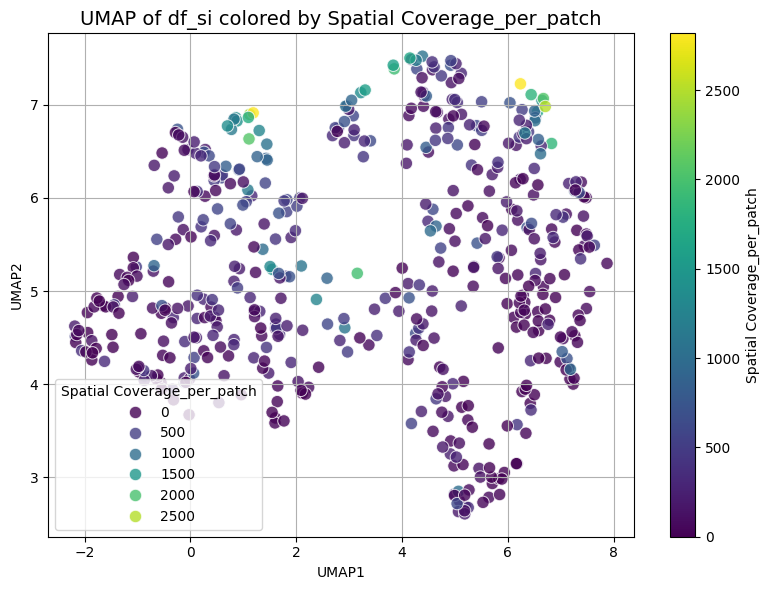

In [81]:
import umap
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
import pandas as pd
final_df = (final_df.groupby(['Condition', 'File_name', 'ECM_ID'], as_index=False).mean(numeric_only=True))
final_df = final_df[['Condition', 'ECM_ID', 'File_name', 'AFT-AI', 'AFT_eccentricity', 'intensity', 'order_value', 'HDM', 'lacunarity', 'FFD', 'endpoints', 'norm_endpoints', 'branch_points', 'norm_branch', 'Mean Speed_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 
                     'Tortuosity_per_patch', 'Spatial Coverage_per_patch']]

final_df = final_df.drop(columns=['File_name', 'ECM_ID'])

df_control = final_df[final_df['Condition'] == 'Control']
df_si = final_df[final_df['Condition'] == 'siCCT8si5']
# --- Переименование для удобства ---
df_si = df_si.rename(columns={'AFT_eccentricity': 'eccentricity'})

# --- Числовые колонки для UMAP ---
numeric_cols = df_si.select_dtypes(include='number').columns
df_numeric = df_si[numeric_cols]

# --- Импутация ---
imputer = SimpleImputer(strategy='median')
df_imputed = imputer.fit_transform(df_numeric)

# --- Масштабирование ---
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_imputed)

# --- UMAP ---
umap_model = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=2,
    metric='euclidean',
    random_state=42
)
umap_result = umap_model.fit_transform(df_scaled)

# --- DataFrame для визуализации ---
umap_df = pd.DataFrame(umap_result, columns=['UMAP1', 'UMAP2'])
umap_df = pd.concat([umap_df, df_si.reset_index(drop=True)], axis=1)  # теперь все колонки df_si есть

# --- Список признаков для раскраски ---
features_to_plot = ['AFT-AI', 'eccentricity', 'intensity', 'order_value', 'HDM', 
                    'lacunarity', 'FFD', 'endpoints', 'norm_endpoints', 'branch_points', 
                    'norm_branch', 'Mean Speed_per_patch', 'Total Distance Traveled_per_patch', 
                    'Track Duration_per_patch', 'Directionality_per_patch', 
                    'Tortuosity_per_patch', 'Spatial Coverage_per_patch']

# --- Построение scatterplot для каждого признака ---
for feature in features_to_plot:
    if feature not in umap_df.columns:
        print(f"Пропущено: {feature} отсутствует в df_si")
        continue  # пропускаем если колонки нет
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    sc = sns.scatterplot(
        x='UMAP1',
        y='UMAP2',
        hue=feature,        # цвет по признаку
        palette='viridis',
        data=umap_df,
        s=80,
        alpha=0.8,
        ax=ax
    )
    
    # Добавляем colorbar через ScalarMappable
    norm = plt.Normalize(vmin=umap_df[feature].min(), vmax=umap_df[feature].max())
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax, label=feature)
    
    ax.set_title(f"UMAP of df_si colored by {feature}", fontsize=14)
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")
    ax.grid(True)
    plt.tight_layout()
    plt.show()



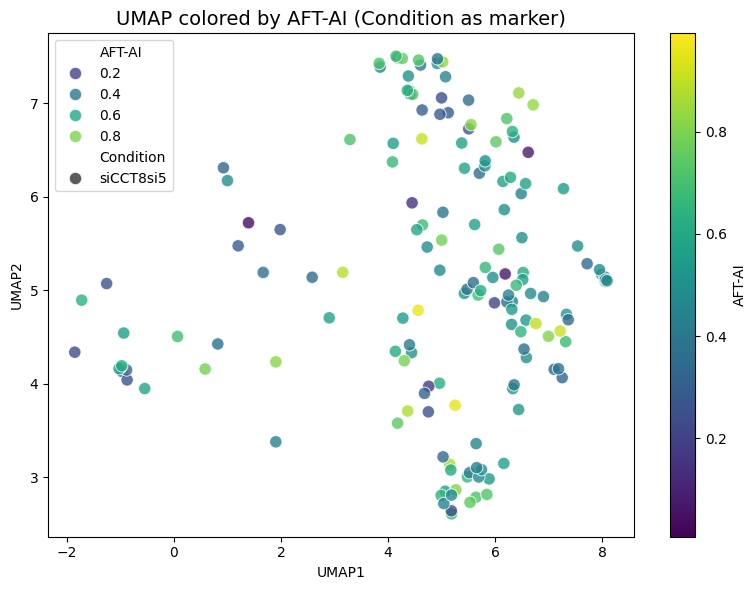

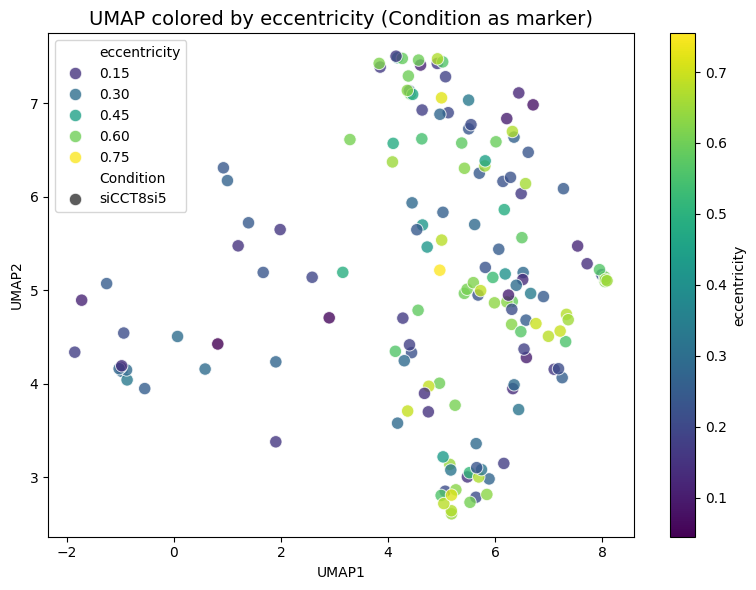

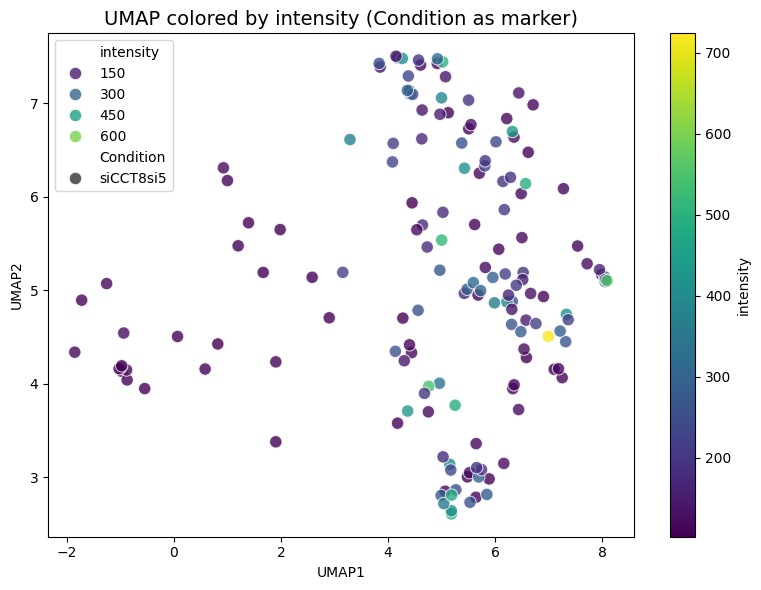

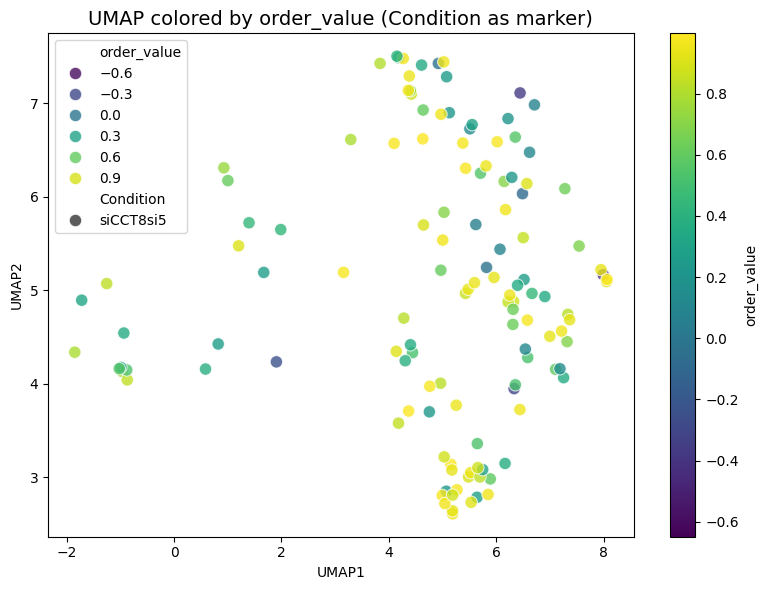

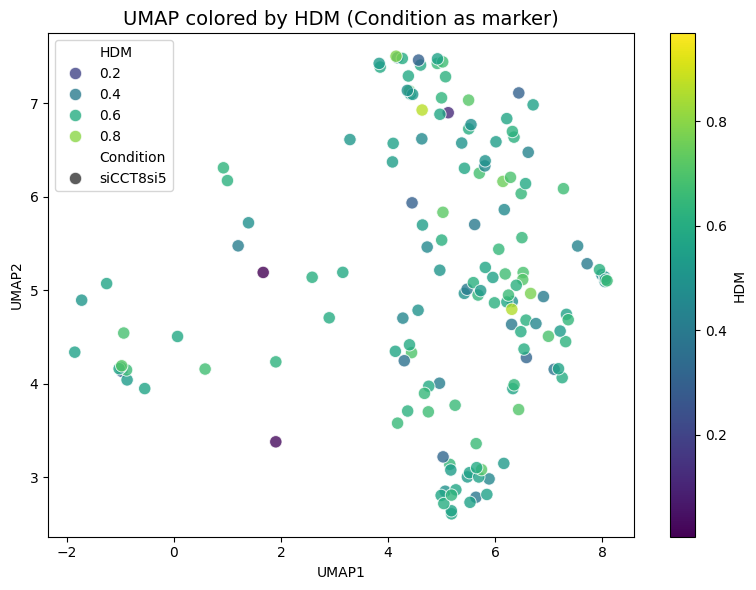

...

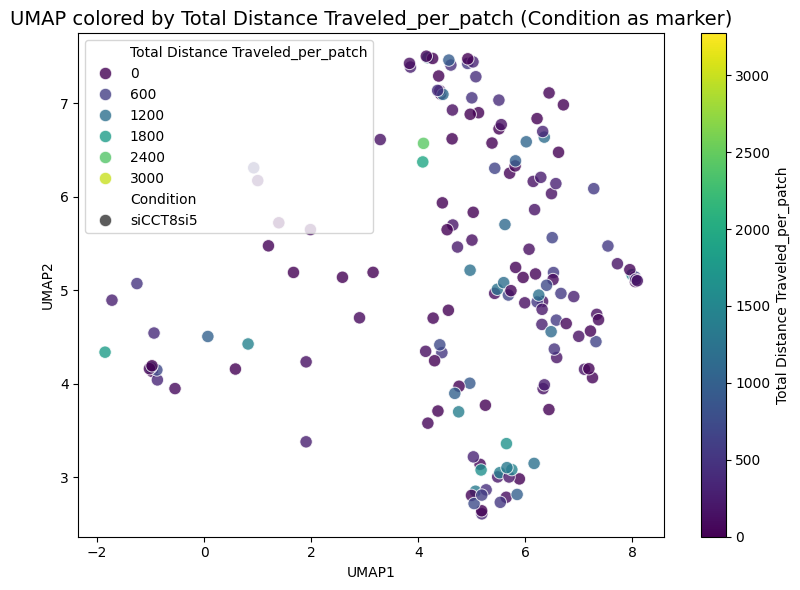

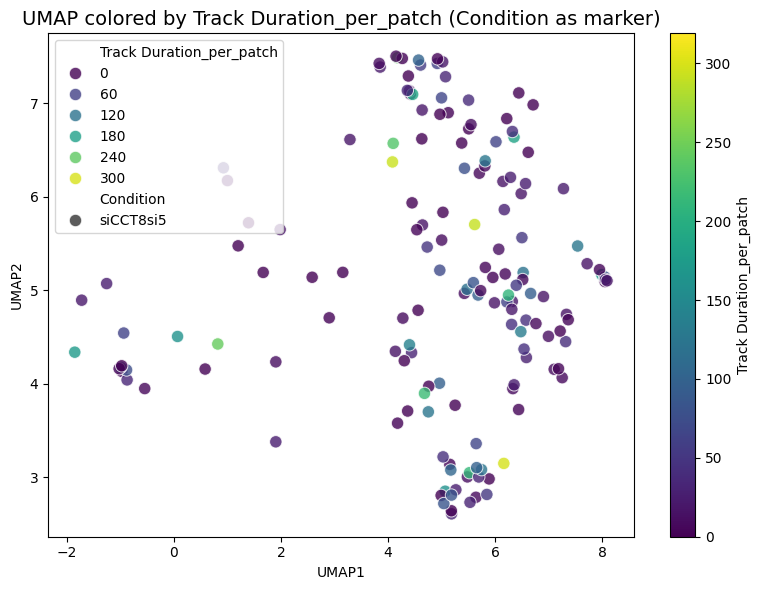

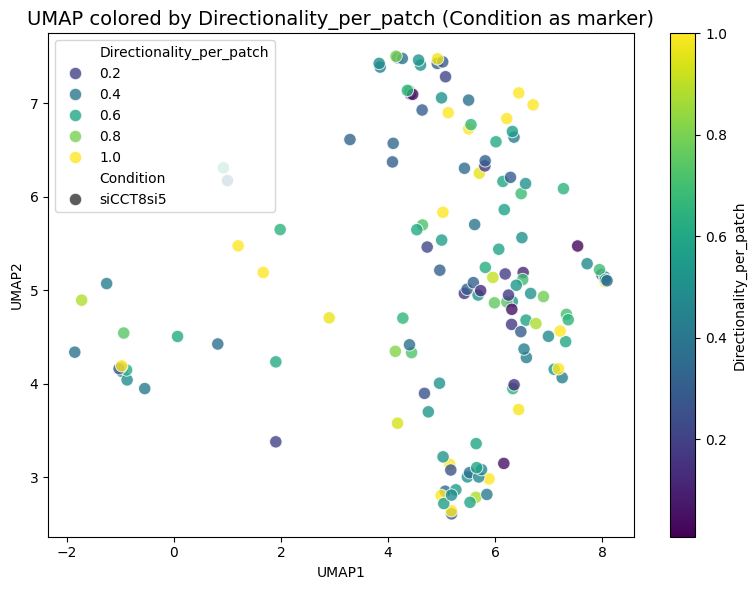

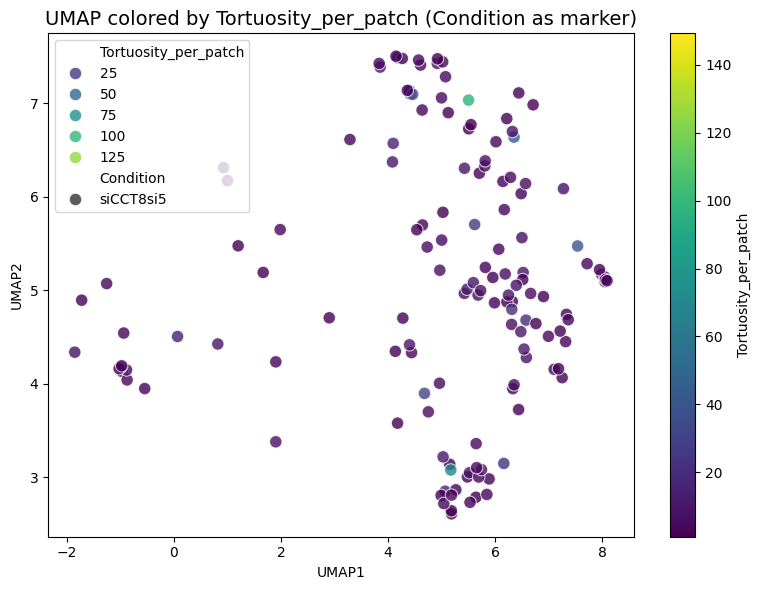

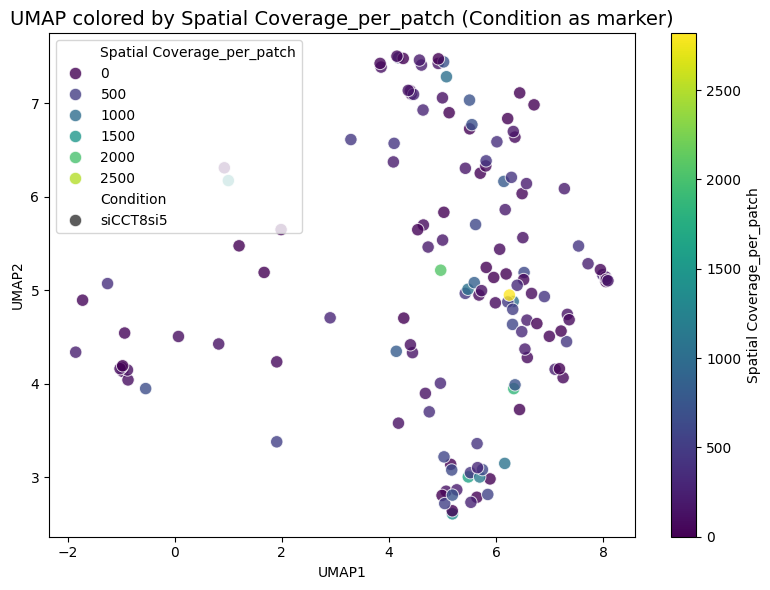

In [70]:
df_si = df_si.rename(columns={
    'AFT_eccentricity': 'eccentricity'})

features_to_plot = ['AFT-AI', 'eccentricity', 'intensity', 'order_value', 'HDM', 'lacunarity', 'FFD', 'endpoints', 'norm_endpoints', 'branch_points', 'norm_branch', 'Mean Speed_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 
                     'Tortuosity_per_patch', 'Spatial Coverage_per_patch'
                     ]

for feature in features_to_plot:
    fig, ax = plt.subplots(figsize=(8, 6))

    # разбивка по Condition через маркеры
    sc = sns.scatterplot(
        x='UMAP1',
        y='UMAP2',
        hue=df_si[feature],           # цвет по признаку
        style=df_si['Condition'],     # форма по Condition
        palette='viridis',
        data=umap_df,
        s=80,
        alpha=0.8,
        ax=ax
    )

    # нормализация для colorbar
    norm = plt.Normalize(
        vmin=df_si[feature].min(),
        vmax=df_si[feature].max()
    )
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label(feature)

    ax.set_title(f"UMAP colored by {feature} (Condition as marker)", fontsize=14)
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")

    plt.tight_layout()
    plt.show()


/Users/iukhtanov.daniil/envs/AFT_tracks/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


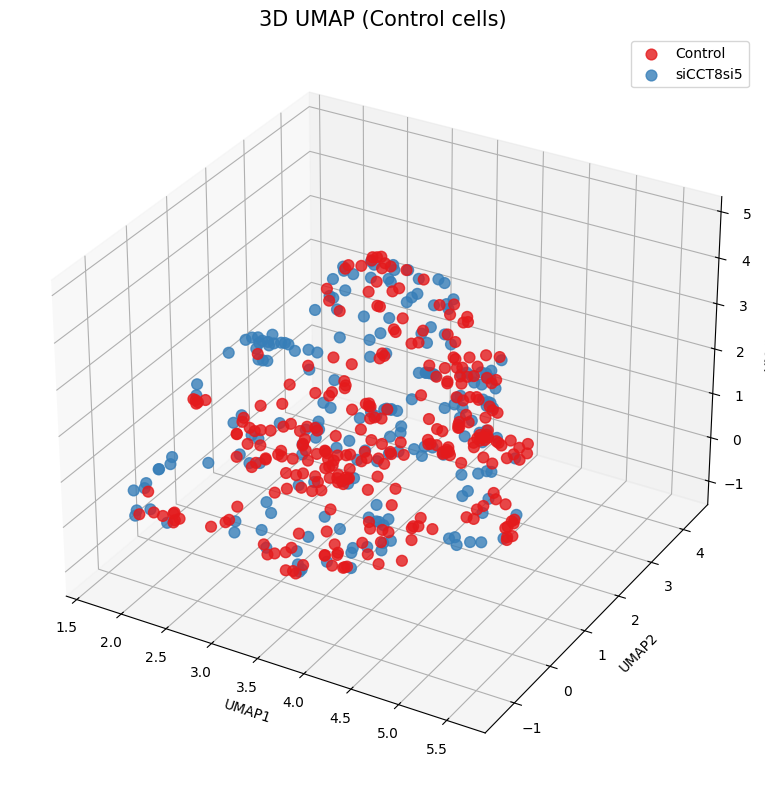

In [111]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
import umap
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa
import seaborn as sns

# числовые колонки
numeric_cols = final_df.select_dtypes(include='number').columns
df_numeric = final_df[numeric_cols]

# imputation
imputer = SimpleImputer(strategy='median')
df_imputed = imputer.fit_transform(df_numeric)

# scaling
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_imputed)

# UMAP (3 компоненты)
umap_model = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=3,
    metric='euclidean',
    random_state=42
)

umap_result = umap_model.fit_transform(df_scaled)

# DataFrame
umap_df = pd.DataFrame(
    umap_result,
    columns=['UMAP1', 'UMAP2', 'UMAP3']
)
umap_df['Condition'] = final_df['Condition'].values

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

conditions = umap_df['Condition'].unique()
palette = sns.color_palette('Set1', len(conditions))

for cond, color in zip(conditions, palette):
    subset = umap_df[umap_df['Condition'] == cond]
    ax.scatter(
        subset['UMAP1'],
        subset['UMAP2'],
        subset['UMAP3'],
        label=cond,
        s=60,
        alpha=0.8,
        color=color
    )

ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")
ax.set_zlabel("UMAP3")
ax.set_title("3D UMAP (Control cells)", fontsize=15)

ax.legend()
plt.tight_layout()
plt.show()


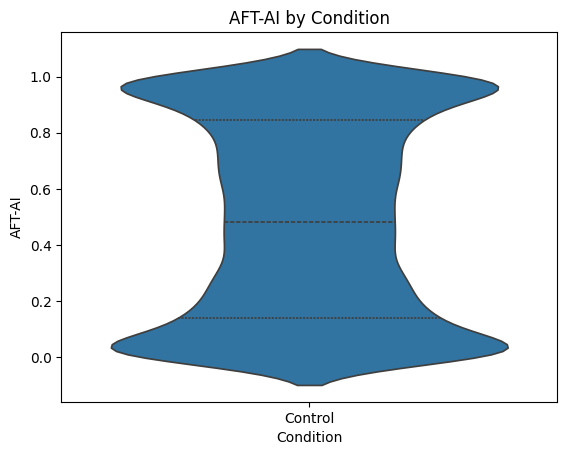

In [23]:
sns.violinplot(
    data=df_control,
    x='Condition',
    y='AFT-AI',
    inner='quartile'
)
plt.title('AFT-AI by Condition')
plt.show()


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
final_df = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT-tracks_final.csv"))
final_df = final_df[['Condition', 'File_name', 'AFT-AI', 'AFT_eccentricity', 'intensity', 'density', 'order_value', 'Mean Speed_per_patch', 'Max Speed_per_patch', 'Min Speed_per_patch', 'Median Speed_per_patch', 'Speed Standard Deviation_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 'Tortuosity_per_patch', 'FMI_x_plus_per_patch', 'FMI_x_minus_per_patch', 'FMI_y_plus_per_patch', 'FMI_y_minus_per_patch', 'FMI_x_plus_spot_per_patch', 'FMI_x_minus_spot_per_patch', 'FMI_y_plus_spot_per_patch', 'FMI_y_minus_spot_per_patch', 'dR_euclidean_per_patch', 'instantaneous_speed_per_patch', 'velocity_correlation_index_spot_per_patch', 'disp_autocorr_spot_per_patch', 'total_path_length_track_per_patch', 'displacement_autocorrelation_function_per_patch', 'average_traveled_distance_per_patch', 'total_path_length_per_patch', 'Mean Speed Rolling', 'Max Speed Rolling', 'Min Speed Rolling Rolling', 'Median Speed Rolling', 'Speed Standard Deviation Rolling', 'Total Distance Traveled Rolling', 'Directionality Rolling', 'Tortuosity Rolling', 'Total Turning Angle Rolling', 'Spatial Coverage Rolling']]

file_list = [
    'Control_R1_ctrl_R1_pos1',
    'Control_R1_ctrl_R1_pos2',
    'Control_R2_ctrl_R2_pos1',
    'Control_R2_ctrl_R2_pos2',
    'Control_R2_ctrl_R2_pos3',
    'Control_R2_ctrl_R2_pos4',
    'Control_R2_ctrl_R2_pos5',
    'siCCT8si5_R2_siCCT8si5_pos16',
    'siCCT8si5_R2_siCCT8si5_R2_pos17',
    'siCCT8si5_R2_siCCT8si5_R2_pos18',
    'siCCT8si5_R2_siCCT8si5_pos19',
    'siCCT8si5_R2_siCCT8si5_pos20',
    'siCCT8si5_R2_siCCT8si5_pos22'
]

# 1. Фильтруем строки по File_name
df = final_df[final_df['File_name'].isin(file_list)].copy()

# 2. Убираем File_name перед корреляцией
df = df.drop(columns=['File_name'], errors='ignore')

# 3. Берем только числовые признаки + Condition
numeric_cols = df.select_dtypes(include='number').columns
df_num = df[numeric_cols.tolist() + ['Condition']]

# 4. Корреляции по Condition (Spearman)
corr_by_condition = {}
for cond, df_cond in df_num.groupby('Condition'):
    corr_by_condition[cond] = df_cond.drop(columns='Condition').corr(method='pearson')

# 5. Heatmap для каждой Condition
# 5. Обычный heatmap для каждой Condition
for cond, corr_mat in corr_by_condition.items():

    plt.figure(figsize=(14, 12))
    
    sns.heatmap(
        corr_mat,
        cmap='coolwarm',
        center=0,
        vmin=-1, vmax=1,
        square=True,
        cbar_kws={'label': 'Pearson correlation'}
    )
    
    plt.title(f'Correlation heatmap — Condition: {cond}')
    plt.tight_layout()
    plt.show()


NameError: name 'Results_Folder' is not defined

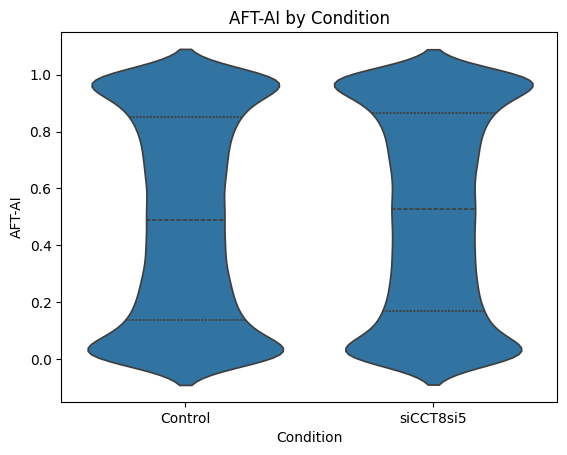

In [33]:
sns.violinplot(
    data=final_df,
    x='Condition',
    y='AFT-AI',
    inner='quartile'
)
plt.title('AFT-AI by Condition')
plt.show()


In [24]:
final_df['AFT-AI'].groupby(final_df['Condition']).describe()

,count,mean,std,min,25%,50%,75%,max
Condition,,,,,,,,
Control,29967.0,0.494044,0.354344,1.566912e-10,0.138934,0.489787,0.849804,1.0
siCCT8si5,30399.0,0.514603,0.350384,8.275771e-09,0.168652,0.526676,0.864029,1.0


In [31]:
final_df.groupby(['Condition', 'File_name'])['AFT-AI'].nunique()


Condition  File_name                      
Control    Control_R1_ctrl_R1_pos1             299
           Control_R1_ctrl_R1_pos2             600
           Control_R1_ctrl_R1_pos3             300
           Control_R1_ctrl_R1_pos4             996
           Control_R1_ctrl_R1_pos5             679
           Control_R2_ctrl_R2_pos1            5842
           Control_R2_ctrl_R2_pos2            2287
           Control_R2_ctrl_R2_pos3            2882
           Control_R2_ctrl_R2_pos4            3654
           Control_R2_ctrl_R2_pos5            2886
           Control_R3_ctrl_R3_pos1            1783
           Control_R3_ctrl_R3_pos2            1280
           Control_R3_ctrl_R3_pos3            3221
           Control_R3_ctrl_R3_pos4            2064
           Control_R3_ctrl_R3_pos5            1194
siCCT8si5  siCCT8si5_R1_siCCT8si5_R1_pos17     600
           siCCT8si5_R1_siCCT8si5_R1_pos18     926
           siCCT8si5_R1_siCCT8si5_R1_pos19     678
           siCCT8si5_R1_siCCT8si5_R1_po

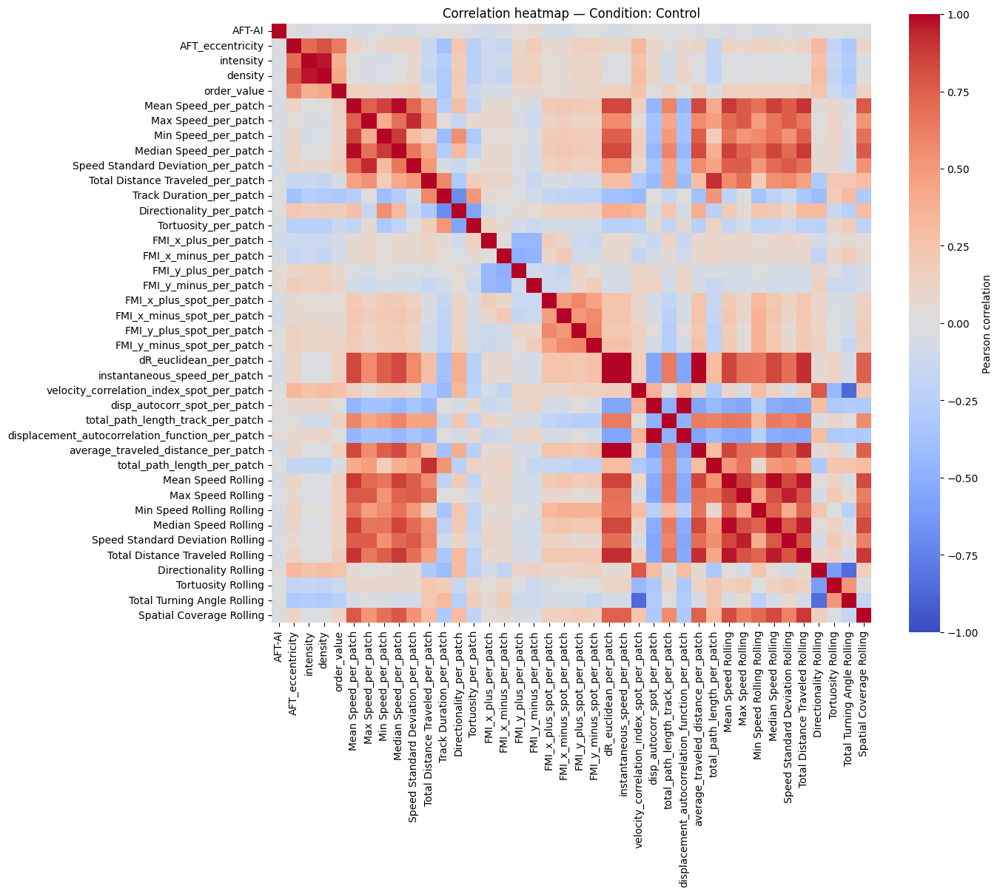

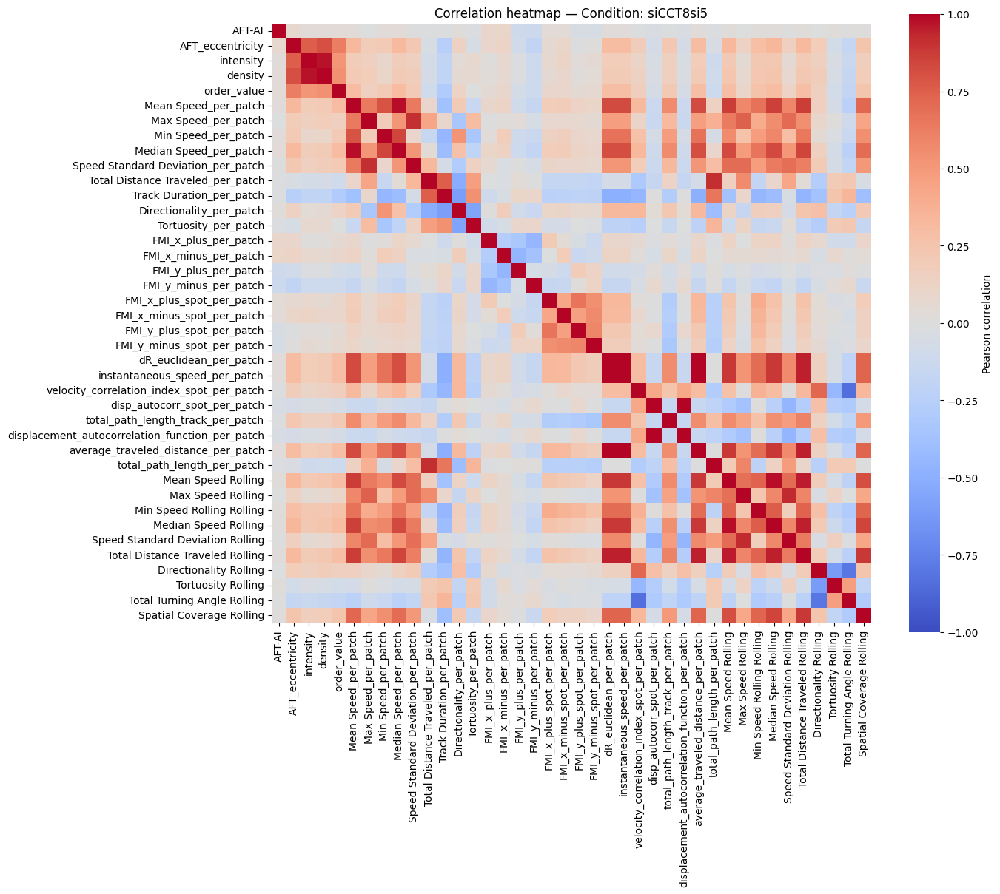

In [29]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
final_df = pd.read_csv(os.path.join(Results_Folder, "merged_Spots_AFT-tracks_final.csv"))
final_df = final_df[['Condition', 'File_name', 'AFT-AI', 'AFT_eccentricity', 'intensity', 'density', 'order_value', 'Mean Speed_per_patch', 'Max Speed_per_patch', 'Min Speed_per_patch', 'Median Speed_per_patch', 'Speed Standard Deviation_per_patch', 'Total Distance Traveled_per_patch', 'Track Duration_per_patch', 'Directionality_per_patch', 'Tortuosity_per_patch', 'FMI_x_plus_per_patch', 'FMI_x_minus_per_patch', 'FMI_y_plus_per_patch', 'FMI_y_minus_per_patch', 'FMI_x_plus_spot_per_patch', 'FMI_x_minus_spot_per_patch', 'FMI_y_plus_spot_per_patch', 'FMI_y_minus_spot_per_patch', 'dR_euclidean_per_patch', 'instantaneous_speed_per_patch', 'velocity_correlation_index_spot_per_patch', 'disp_autocorr_spot_per_patch', 'total_path_length_track_per_patch', 'displacement_autocorrelation_function_per_patch', 'average_traveled_distance_per_patch', 'total_path_length_per_patch', 'Mean Speed Rolling', 'Max Speed Rolling', 'Min Speed Rolling Rolling', 'Median Speed Rolling', 'Speed Standard Deviation Rolling', 'Total Distance Traveled Rolling', 'Directionality Rolling', 'Tortuosity Rolling', 'Total Turning Angle Rolling', 'Spatial Coverage Rolling']]
df = final_df.copy()
# 2. Убираем File_name перед корреляцией
df = df.drop(columns=['File_name'], errors='ignore')

# 3. Берем только числовые признаки + Condition
numeric_cols = df.select_dtypes(include='number').columns
df_num = df[numeric_cols.tolist() + ['Condition']]

# 4. Корреляции по Condition (Spearman)
corr_by_condition = {}
for cond, df_cond in df_num.groupby('Condition'):
    corr_by_condition[cond] = df_cond.drop(columns='Condition').corr(method='pearson')

# 5. Heatmap для каждой Condition
# 5. Обычный heatmap для каждой Condition
for cond, corr_mat in corr_by_condition.items():

    plt.figure(figsize=(14, 12))
    
    sns.heatmap(
        corr_mat,
        cmap='coolwarm',
        center=0,
        vmin=-1, vmax=1,
        square=True,
        cbar_kws={'label': 'Pearson correlation'}
    )
    
    plt.title(f'Correlation heatmap — Condition: {cond}')
    plt.tight_layout()
    plt.show()


In [30]:
final_df['AFT-AI'].groupby(final_df['Condition']).describe()

,count,mean,std,min,25%,50%,75%,max
Condition,,,,,,,,
Control,29967.0,0.494044,0.354344,1.566912e-10,0.138934,0.489787,0.849804,1.0
siCCT8si5,30399.0,0.514603,0.350384,8.275771e-09,0.168652,0.526676,0.864029,1.0


In [ ]:
print(merged_df.columns)
print(merged_df['Condition'].unique())

In [ ]:
print(merged_df['ECM_x'].unique())

In [ ]:
ECM_df_columns = ['track_angle', 'AFT_angle', 'image_name',
       'ECM_x', 'ECM_y', 'AFT-AI', 'AFT_eccentricity', 'intensity',
       'density', 'ECM_ID', 'POSITION_X', 'POSITION_Y', 'Condition', 'order_value', 'window_size', 'overlap',
       'neighborhood_radius', 'Distance_of_the_track_between_two_spots',
       'CI_in_each_spot_horizontal_axis', 'CI_in_each_spot_vertical_axis',
       'FMI_x_plus_spot', 'FMI_y_plus_spot', 'FMI_x_minus_spot',
       'FMI_y_minus_spot', 'instantaneous_velocity',
       'velocity_angle_rad']
mean_columns = ['track_angle', 'Distance_of_the_track_between_two_spots',
       'CI_in_each_spot_horizontal_axis', 'CI_in_each_spot_vertical_axis',
       'FMI_x_plus_spot', 'FMI_y_plus_spot', 'FMI_x_minus_spot',
       'FMI_y_minus_spot', 'instantaneous_velocity',
       'velocity_angle_rad']
ECM_df = merged_df[ECM_df_columns]

In [ ]:
print(ECM_df['POSITION_X'].max())

698.9810816576363


In [ ]:
ECM_df.to_csv('/content/output/ECM_df.csv', index=False)

In [ ]:
base = ECM_df[['ECM_ID', 'Condition', 'image_name', 'AFT_eccentricity', 'AFT_angle', 'intensity',
       'density', 'order_value']]

grouped_mean = (
    ECM_df.groupby(['ECM_ID', 'image_name'])[mean_columns]
          .mean()
          .reset_index()
)

ECM = grouped_mean.merge(base, on=['ECM_ID', 'image_name'], how='left')


In [ ]:
ECM.to_csv('/content/output/ECM.csv', index=False)

In [ ]:
print(grouped_final.columns)

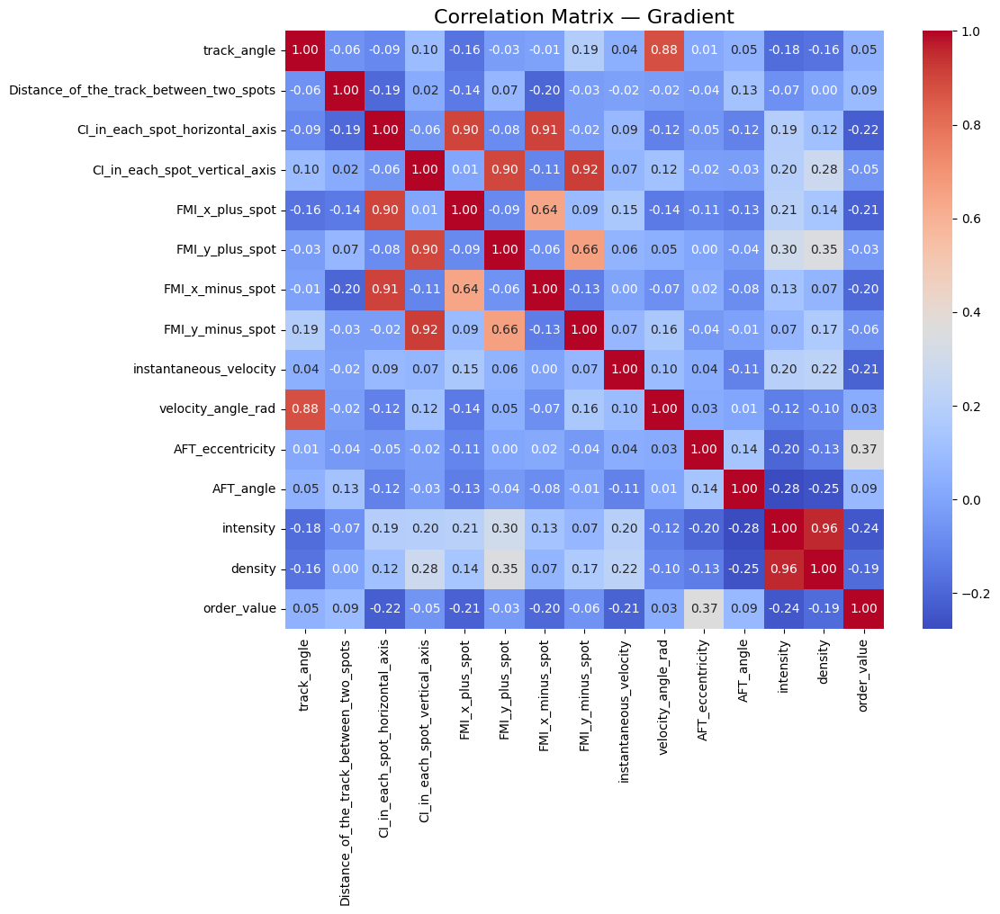

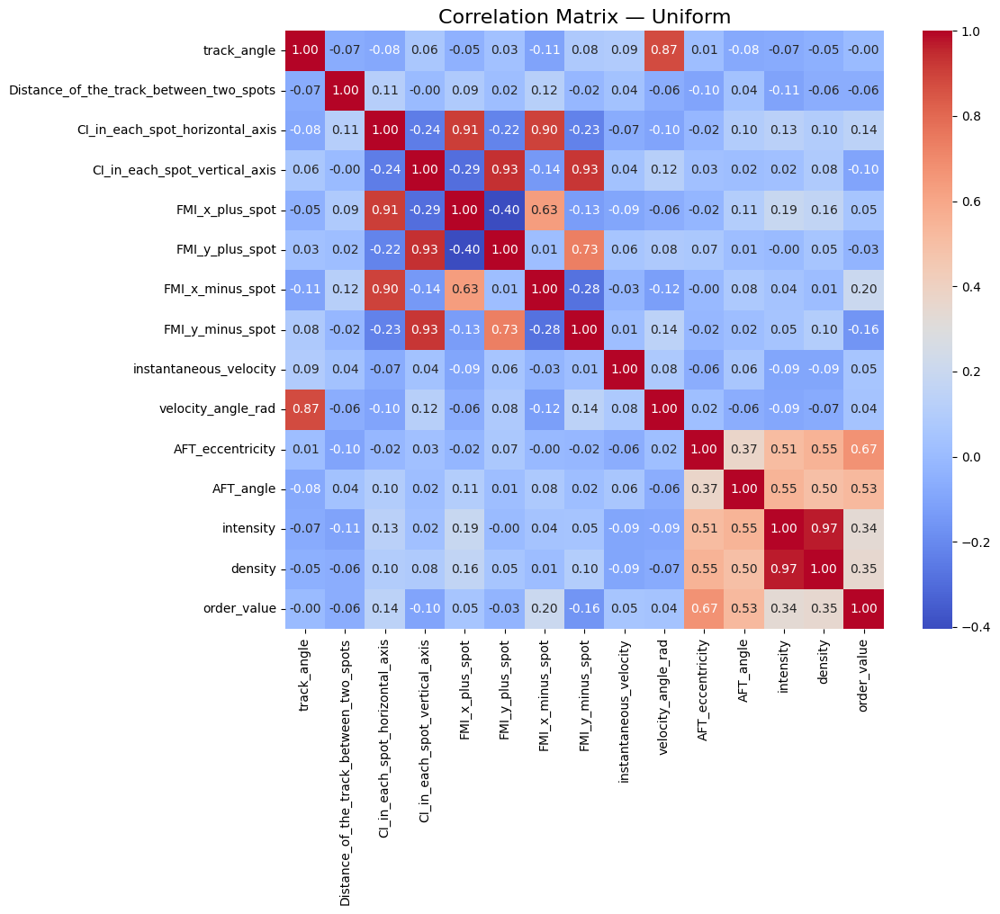

In [ ]:
image_names = ECM["Condition"].unique()

for name in image_names:
    sub = ECM[ECM["Condition"] == name]
    corr = sub.corr(numeric_only=True)

    plt.figure(figsize=(12, 10))
    sns.heatmap(
        corr,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        square=True
    )
    plt.title(f"Correlation Matrix — {name}", fontsize=16)
    plt.tight_layout()
    plt.show()



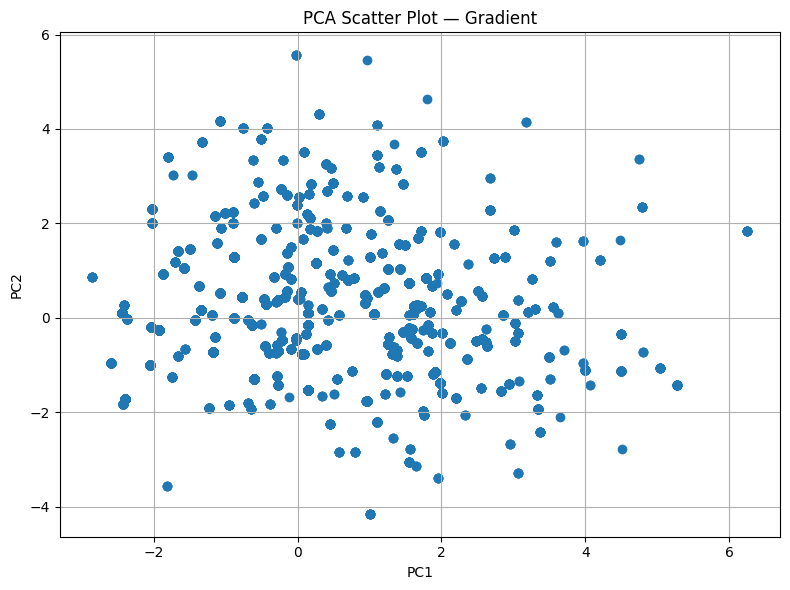

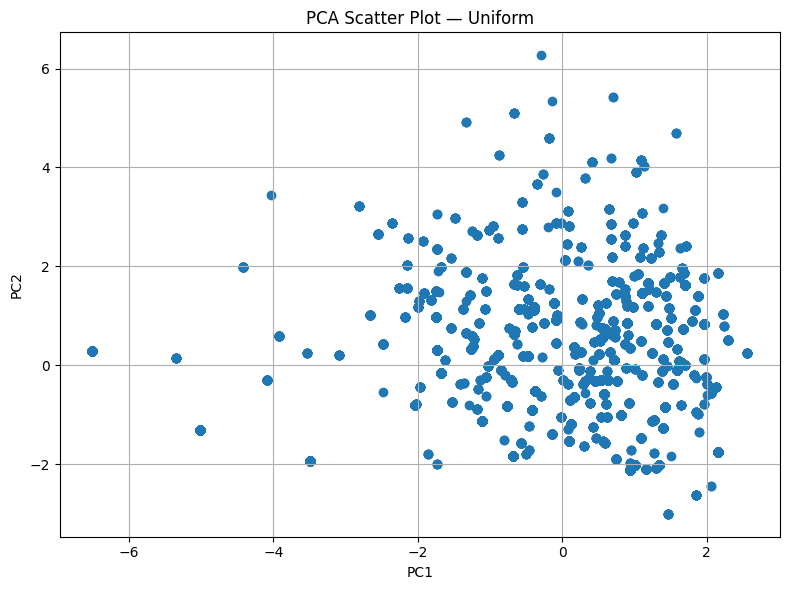

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import umap
import matplotlib.pyplot as plt

#ECM = ECM.drop([
#    'FMI_x_plus_spot', 'FMI_y_plus_spot',
#    'FMI_x_minus_spot', 'FMI_y_minus_spot',
#    'velocity_angle_rad', 'density'
#], axis=1)

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

image_names = ECM["Condition"].unique()

for name in image_names:
    sub = ECM[ECM["Condition"] == name]

    # --- только числовые ---
    X = sub.select_dtypes(include=[float, int]).dropna()

    if X.shape[0] == 0:
        print(f"⚠️ В '{name}' нет строк без NaN — PCA пропущен.")
        continue

    # --- масштабируем ---
    X_scaled = StandardScaler().fit_transform(X)

    # --- PCA на 2 компоненты специально для scatter ---
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    # --- Scatter plot (PC1 vs PC2) ---
    plt.figure(figsize=(8, 6))
    plt.scatter(X_pca[:, 0], X_pca[:, 1])
    plt.title(f"PCA Scatter Plot — {name}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.grid(True)
    plt.tight_layout()
    plt.show()



In [ ]:
all_parameters = True # @param {type: "boolean"}

metric_1 = "AFT_eccentricity"  # @param all_columns
metric_2 = "instantaneous_velocity"  # @param all_columns

exclude_cols = ['LABEL', 'ID', 'TRACK_ID', 'FRAME', 'QUALITY', 'Condition',
                'File_name', 'MANUAL_SPOT_COLOR', 'File_name_raw', 'experiment_nb',
                'Repeat', 'Unique_ID', 'TRACK_Z_LOCATION', 'RADIUS', 'POSITION_Z',
                'NUMBER_COMPLEX', 'VISIBILITY', 'NUMBER_SPLITS', 'NUMBER_MERGES']

quantitative_cols = [c for c in merged_df.columns.tolist() if c not in exclude_cols]

parameters_df = merged_df[['TRACK_ID', 'Condition']].drop_duplicates().reset_index(drop=True)
for col in [metric_1, metric_2]:
    medians = merged_df.groupby(['TRACK_ID', 'Condition'], as_index=False)[col].median()
    parameters_df = parameters_df.merge(medians, on=['TRACK_ID', 'Condition'], how='left')

merged = parameters_df.dropna()

plt.figure(figsize=(6, 5))
sns.scatterplot(
    data=merged,
    x=metric_1,
    y=metric_2,
    hue='Condition',
    palette='Set2',
    edgecolor='k',
    s=60
)
plt.xlabel(metric_1)
plt.ylabel(metric_2)
plt.title(f'{metric_1} vs {metric_2}')

if merged[metric_1].between(0, 1).all():
    plt.xlim(0, 1)
if merged[metric_2].between(0, 1).all():
    plt.ylim(0, 1)

plt.legend(title='Condition', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [ ]:
metric_columns = [c for c in quantitative_cols if c in merged_df.columns]

parameters_df = merged_df[['TRACK_ID', 'Condition']].drop_duplicates().reset_index(drop=True)
for col in metric_columns:
    medians = merged_df.groupby(['TRACK_ID', 'Condition'], as_index=False)[col].median()
    parameters_df = parameters_df.merge(medians, on=['TRACK_ID', 'Condition'], how='left')

merged = parameters_df.dropna()

metric_columns = [col for col in merged.columns if col not in ['TRACK_ID', 'Condition']]
pairs = list(combinations(metric_columns, 2))

# Columns involved in pairs (unique)
cols = list(set([col for pair in pairs for col in pair]))
cols = [col for col in cols if col in merged.columns]
# Get list of unique conditions
conditions = merged['Condition'].unique()

# Plot heatmap for each condition
for cond in conditions:
    subset = merged[merged['Condition'] == cond]

    # Calculate correlation matrix for subset
    corr_matrix = subset[cols].corr()

    plt.figure(figsize=(56, 48))
    sns.heatmap(
        corr_matrix,
        annot=True,
        annot_kws={"size": 7},
        cmap='coolwarm',
        vmin=-1,
        vmax=1,
        square=True,
        linewidths=.5,
        cbar_kws={"shrink": .8}
    )
    plt.title(f'Correlation Matrix Heatmap — Condition: {cond}')
    plt.show()


In [ ]:
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN

import math
import umap

In [ ]:
# --- PCA without coloring by parameters ---

# Metrics for PCA
features = [c for c in quantitative_cols if c in merged_df.columns]

# Drop rows with missing values in key features
df_all = merged.dropna(subset=features + ['Condition'])

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_all[features])

# Run PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Create DataFrame with PCA results
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['Condition'] = df_all['Condition'].values

# --- Simple PCA plot (colored only by Condition) ---
plt.figure(figsize=(7, 6))
sns.scatterplot(
    x='PC1', y='PC2',
    hue='Condition',
    data=df_pca,
    palette='Set2',
    s=60, edgecolor='k'
)

plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
plt.axhline(0, ls='--', color='gray')
plt.axvline(0, ls='--', color='gray')
plt.title("PCA (colored by Condition)")
plt.legend(title="Condition")
plt.show()


In [ ]:
# --- PCA plots colored by each parameter ---

# Add features into PCA dataframe
for feat in features:
    df_pca[feat] = df_all[feat].values

# Determine subplot grid: 2 rows
n_feats = len(features)
ncols = math.ceil(n_feats / 2)
nrows = 2

fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
axes = axes.flatten()

for i, feat in enumerate(features):
    ax = axes[i]
    sc = ax.scatter(
        df_pca['PC1'], df_pca['PC2'],
        c=df_pca[feat], cmap='viridis', s=60,
        edgecolor=sns.color_palette("tab10")[0] if df_pca['Condition'].nunique() == 1 else None,
        linewidth=0.7
    )

    # If more than one condition, add edges by condition
    if df_pca['Condition'].nunique() > 1:
        for cond in df_ppa['Condition'].unique():
            subset = df_pca[df_pca['Condition'] == cond]
            ax.scatter(
                subset['PC1'], subset['PC2'],
                facecolors='none',
                edgecolors=sns.color_palette("tab10")[list(df_pca['Condition'].unique()).index(cond)],
                s=60, linewidth=1.2, label=cond
            )
        ax.legend(title="Condition")

    ax.set_title(f'Colored by {feat}')
    ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
    ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
    ax.axhline(0, ls='--', color='gray')
    ax.axvline(0, ls='--', color='gray')
    plt.colorbar(sc, ax=ax, label=feat)

# Hide unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
# --- t-SNE without coloring by parameters ---

# Run t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# Create DataFrame with t-SNE results
df_tsne = pd.DataFrame(X_tsne, columns=['tSNE1', 'tSNE2'])
df_tsne['Condition'] = df_all['Condition'].values

# --- Simple t-SNE plot (colored only by Condition) ---
plt.figure(figsize=(7, 6))
sns.scatterplot(
    x='tSNE1', y='tSNE2',
    hue='Condition',
    data=df_tsne,
    palette='Set2',
    s=60, edgecolor='k'
)

plt.xlabel("tSNE1")
plt.ylabel("tSNE2")
plt.axhline(0, ls='--', color='gray')
plt.axvline(0, ls='--', color='gray')
plt.title("t-SNE (colored by Condition)")
plt.legend(title="Condition")
plt.show()

In [ ]:
# --- t-SNE plots colored by each parameter ---

# Add features into t-SNE dataframe
for feat in features:
    df_tsne[feat] = df_all[feat].values

# Subplot grid (2 rows)
n_feats = len(features)
ncols = math.ceil(n_feats / 2)
nrows = 2

fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
axes = axes.flatten()

for i, feat in enumerate(features):
    ax = axes[i]
    sc = ax.scatter(
        df_tsne['tSNE1'], df_tsne['tSNE2'],
        c=df_tsne[feat], cmap='viridis', s=60,
        edgecolor='k', linewidth=0.5
    )

    # Outline points by condition
    for cond in df_tsne['Condition'].unique():
        subset = df_tsne[df_tsne['Condition'] == cond]
        ax.scatter(
            subset['tSNE1'], subset['tSNE2'],
            facecolors='none',
            edgecolors=sns.color_palette("tab10")[list(df_tsne['Condition'].unique()).index(cond)],
            s=60, linewidth=1.2, label=cond
        )
    ax.legend(title='Condition')

    ax.set_title(f't-SNE colored by {feat}')
    ax.set_xlabel('tSNE1')
    ax.set_ylabel('tSNE2')
    ax.axhline(0, ls='--', color='gray')
    ax.axvline(0, ls='--', color='gray')
    plt.colorbar(sc, ax=ax, label=feat)

# Hide unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
# --- UMAP without DBSCAN ---

# Filter and scale features
filtered_df = merged_df[features + ['Condition']].dropna()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(filtered_df[features])

# Run UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
X_umap = reducer.fit_transform(X_scaled)

# Create DataFrame
df_umap = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2'])
df_umap['Condition'] = filtered_df['Condition'].values

# --- Plot UMAP colored by Condition ---
plt.figure(figsize=(8, 6))
palette_conditions = sns.color_palette("Set2", n_colors=df_umap['Condition'].nunique())

sns.scatterplot(
    x='UMAP1', y='UMAP2',
    hue='Condition',
    data=df_umap,
    palette=palette_conditions,
    s=60, edgecolor='k'
)

plt.title("UMAP (colored by Condition)")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.grid(False)
plt.legend(title="Condition", bbox_to_anchor=(1, 1))
plt.show()


In [ ]:
# --- UMAP plots colored by each parameter ---

# Add features into UMAP dataframe
for feat in features:
    df_umap[feat] = filtered_df[feat].values

import math
n_feats = len(features)
ncols = 3
nrows = math.ceil(n_feats / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(6 * ncols, 5 * nrows))
axes = axes.flatten()

for i, feat in enumerate(features):
    ax = axes[i]
    sc = ax.scatter(
        df_umap['UMAP1'], df_umap['UMAP2'],
        c=df_umap[feat], cmap='viridis', s=60,
        edgecolor='k', linewidth=0.4
    )
    ax.set_title(f"UMAP colored by {feat}")
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")
    plt.colorbar(sc, ax=ax)

# Hide unused axes if grid > features
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
# --- UMAP + DBSCAN without parameters ---

# Filter and scale features
filtered_df = merged_df[features + ['Condition']].dropna()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(filtered_df[features])

# Run UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
X_umap = reducer.fit_transform(X_scaled)

eps = 1.5  # @param {type: "number"}
min_samples = 10  # @param {type: "integer"}

# Run DBSCAN clustering
dbscan = DBSCAN(eps=1.5, min_samples=10)
clusters = dbscan.fit_predict(X_umap)

# Create DataFrame
df_umap = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2'])
df_umap['DBSCAN_cluster'] = clusters
df_umap['Condition'] = filtered_df['Condition'].values

# --- Plot UMAP with DBSCAN clusters (color) + Condition (edges) ---
plt.figure(figsize=(8, 6))
palette_clusters = sns.color_palette(
    "tab10", n_colors=len(set(clusters)) - (1 if -1 in clusters else 0)
)
palette_conditions = sns.color_palette("Set2", n_colors=df_umap['Condition'].nunique())

sns.scatterplot(
    x='UMAP1', y='UMAP2', data=df_umap,
    hue='DBSCAN_cluster',
    palette=palette_clusters,
    edgecolor=None, s=60, legend='full'
)

# Add condition outlines
for i, cond in enumerate(df_umap['Condition'].unique()):
    subset = df_umap[df_umap['Condition'] == cond]
    plt.scatter(
        subset['UMAP1'], subset['UMAP2'],
        facecolors='none',
        edgecolors=palette_conditions[i],
        s=100, linewidth=1.5,
        label=f"Condition: {cond}"
    )

plt.title("UMAP + DBSCAN clusters (color) + Condition (edge)")
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.grid(False)
plt.show()
